In [ ]:
# mount google drive and select this drive
from google.colab import drive
drive.mount('/content/drive')
import os
os.chdir('/content/drive/Shareddrives/RustAgent/RustAgent/pretraining')

Mounted at /content/drive


In [ ]:
import cv2
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
import random
from tqdm.auto import tqdm # Import tqdm
from torch.amp import autocast, GradScaler
from PIL import Image
import time
import math
import matplotlib.pyplot as plt
import torchvision
import gc
from torch.optim.lr_scheduler import OneCycleLR
!pip install ultralytics

from ultralytics import YOLO
os.environ['YOLO_VERBOSE'] = 'False'

print("CUDA available:", torch.cuda.is_available())
print("Imports resolved")
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 69.5 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
CUDA available: True
Imports resolved


# CONFIG

In [ ]:
class Config:
  ACTION_DIM = [2, 2, 3, 3]
  FEATURE_DIM = [320, 320, 3]

  LEARNING_RATE = 1e-4
  EPOCHS = 100

  GRADIENT_CLIP = 1.0

  BATCH_SIZE = 512

  SEQ_LEN = 80

  CONTEXT_FRAMES = 5
  CHUNK_SIZE = 10


# MODEL

In [ ]:
class Model(nn.Module):
    def __init__(self, chunk_size=10, pretrained=None):
        super(Model, self).__init__()
        self.action_space = Config.ACTION_DIM # e.g., [3, 3, 2, 2] for your discrete actions
        self.chunk_size = chunk_size
        self.d_model = 512

        self.yolo_internal_features = None

        self.channel_squish = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=256, kernel_size=1),
            nn.BatchNorm2d(256),
            nn.SiLU(),
        )
        self.flattened_dim = 256 * 2

        # YOLO Setup
        self.yolo = YOLO("best.pt")
        for param in self.yolo.parameters():
            param.requires_grad = False
        self.yolo.eval()

        def hook_fn(module, input, output):
            self.yolo_internal_features = output

        self.yolo.model.model[22].register_forward_hook(hook_fn)

        self.max_objects = 8
        self.yolo_feature_dim = self.max_objects * 5

        # --- TRANSFORMER CHUNKER SETUP ---
        self.input_dim = self.flattened_dim + self.yolo_feature_dim

        # Project combined YOLO/Spatial features to the Transformer's working dimension
        self.feature_proj = nn.Linear(self.input_dim, self.d_model)

        # Learned queries representing the 'K' future time steps
        self.action_queries = nn.Embedding(self.chunk_size, self.d_model)

        # Transformer Decoder
        decoder_layer = nn.TransformerDecoderLayer(d_model=self.d_model, nhead=8, batch_first=True)
        self.transformer = nn.TransformerDecoder(decoder_layer, num_layers=4)

        # Actor heads (Predicting chunk_size actions for each discrete dimension)
        self.policy_heads = nn.ModuleList([nn.Linear(self.d_model, action_dim) for action_dim in self.action_space])
        self.value_head = nn.Linear(self.d_model, 1)

    def forward(self, x):
        # x shape: (batch_size, seq_len, C, H, W)
        b, s, c, h, w = x.shape
        x_flat = x.view(-1, c, h, w)

        # 1. Pass image through YOLO
        yolo_output = self.yolo.model(x_flat * 255.0)[0]
        yolo_features = torch.zeros((b * s, self.max_objects, 5), device=x.device)
        yolo_features = self._non_maximum_suppression(yolo_output, yolo_features, b, s)
        yolo_features = yolo_features.view(b, s, -1)

        # 2. Extract YOLO internal features via hook
        spatial_features = self.yolo_internal_features.clone()
        spatial_features = self.channel_squish(spatial_features)
        spatial_features = self._spatial_softmax(spatial_features)
        spatial_features = spatial_features.view(b, s, -1)

        # 3. Combine and project for Transformer Memory
        combined_features = torch.cat([spatial_features, yolo_features], dim=-1) # (b, s, 552)
        memory = self.feature_proj(combined_features) # (b, s, d_model)

        # 4. Generate queries and pass through Transformer
        queries = self.action_queries.weight.unsqueeze(0).repeat(b, 1, 1) # (b, chunk_size, d_model)
        chunk_embeddings = self.transformer(tgt=queries, memory=memory)   # (b, chunk_size, d_model)

        # 5. Output distributions for each discrete action head
        value = self.value_head(chunk_embeddings)
        x_logits = [policy_head(chunk_embeddings) for policy_head in self.policy_heads]

        # Returns a list of tensors, each shaped [Batch, Chunk_Size, Num_Classes]
        return x_logits, value

    def _spatial_softmax(self, x):
        b, c, h, w = x.shape
        x = x.view(b, c, h * w)
        softmax = torch.softmax(x, dim=-1)

        xs = torch.linspace(-1.0, 1.0, w, device=x.device)
        ys = torch.linspace(-1.0, 1.0, h, device=x.device)
        grid_y, grid_x = torch.meshgrid(ys, xs, indexing="ij")
        grid_x = grid_x.reshape(-1)
        grid_y = grid_y.reshape(-1)

        exp_x = torch.sum(softmax * grid_x, dim=-1)
        exp_y = torch.sum(softmax * grid_y, dim=-1)
        return torch.cat([exp_x, exp_y], dim=-1)

    def _non_maximum_suppression(self, yolo_raw, yolo_features, b, s):
        for i in range(b * s):
            preds = yolo_raw[i].transpose(0, 1)
            cx, cy, w_, h_ = preds[:, 0], preds[:, 1], preds[:, 2], preds[:, 3]
            x1 = cx - w_ / 2
            y1 = cy - h_ / 2
            x2 = cx + w_ / 2
            y2 = cy + h_ / 2
            boxes = torch.stack((x1, y1, x2, y2), dim=1)

            class_scores = preds[:, 4:]
            max_scores, class_ids = torch.max(class_scores, dim=1)

            conf_mask = max_scores > 0.25
            f_boxes = boxes[conf_mask]
            f_scores = max_scores[conf_mask]
            f_classes = class_ids[conf_mask]

            if len(f_boxes) > 0:
                keep_idx = torchvision.ops.batched_nms(f_boxes, f_scores, f_classes, iou_threshold=0.45)
                keep_idx = keep_idx[:self.max_objects]
                num_objs = len(keep_idx)

                yolo_features[i, :num_objs, 0:4] = f_boxes[keep_idx]
                yolo_features[i, torch.arange(num_objs), 4] = f_scores[keep_idx]
        return yolo_features

# Dataset

In [ ]:
class RustImageDataset(Dataset):
    def __init__(self, folder_path, action_file, context_frames=5, chunk_size=10, episode_length=80):
        self.folder_path = folder_path
        self.context_frames = context_frames
        self.chunk_size = chunk_size
        self.episode_length = episode_length

        # Load all targets
        self.targets = torch.from_numpy(np.loadtxt(action_file, delimiter=",")).long()
        self.total_frames = len(self.targets)
        self.transform = transforms.ToTensor()

        # rwd is the 5th column, actions are first 4 columns
        self.rewards = self.targets[:, 4]
        self.targets = self.targets[:, :4]

        # Calculate valid 't' indices to avoid cross-episode overlap
        self.valid_indices = []
        num_episodes = self.total_frames // self.episode_length

        for ep in range(num_episodes):
            ep_start = ep * self.episode_length
            ep_end = ep_start + self.episode_length

            # Minimum t to have enough past context frames within the current episode
            start_t = ep_start + self.context_frames - 1
            # Maximum t to have enough future chunk frames within the current episode
            end_t = ep_end - self.chunk_size

            if start_t <= end_t:
                # +1 because range is exclusive at the end
                self.valid_indices.extend(range(start_t, end_t + 1))

    def __len__(self):
        return len(self.valid_indices)

    def __getitem__(self, idx):
        # 't' is the current timestep (the most recent image the model receives)
        t = self.valid_indices[idx]

        frames = []
        # Fetch the past 'context_frames' (e.g., from t-4 up to t)
        for i in range(t - self.context_frames + 1, t + 1):
            # Keeping your +40000 offset
            img_path = os.path.join(self.folder_path, f"frame_{i+40000:06d}.jpg")

            with Image.open(img_path) as img:
                img_resized = img.resize((320, 320))
                img_tensor = self.transform(img_resized)
            frames.append(img_tensor)

        sequence = torch.stack(frames)

        # Fetch the future 'chunk_size' actions (e.g., from t up to t + 10)
        target_actions = self.targets[t : t + self.chunk_size]

        return sequence, target_actions

def get_class_weights(action_file, action_dim_index, device):
    targets_np = np.loadtxt(action_file, delimiter=",").astype(int)

    # Count how many times each bin was used
    counts = np.bincount(targets_np[:, action_dim_index])

    # Prevent division by zero for unused bins
    counts = np.where(counts == 0, 1, counts)

    # Calculate inverse frequency
    weights = 1.0 / counts

    # NEW: Cap the maximum weight to prevent gradient explosions on extremely rare actions
    # This ensures rare actions are prioritized, but not heavily enough to destabilize training
    max_safe_weight = np.median(weights) * 10.0
    weights = np.clip(weights, a_min=None, a_max=max_safe_weight)

    # Normalize
    weights = weights / weights.sum()

    return torch.FloatTensor(weights).to(device)

# Generate a specific weight tensor for each of your 4 action heads
weights_list = [get_class_weights("movement_log.csv", i, DEVICE) for i in range(len(Config.ACTION_DIM))]

In [ ]:
def plot_training_progress(history, save_dir="./"):
    # Create the directory on Drive if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    plt.figure(figsize=(12, 6))

    epochs = range(1, len(history['epoch_loss']) + 1)
    plt.plot(epochs, history['epoch_loss'], label='Total Loss', color='royalblue', marker='o', alpha=0.5)
    if len(history['epoch_loss']) >= 3:
        window = 3
        moving_avg = np.convolve(history['epoch_loss'], np.ones(window)/window, mode='valid')
        plt.plot(range(window, len(history['epoch_loss']) + 1), moving_avg,
                 label=f'{window}-Epoch Moving Avg', color='darkorange', linewidth=3)
    plt.title('Rust Agent: Imitation Learning Progress', fontsize=14)
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel('Loss (Cross Entropy)', fontsize=12)
    plt.grid(True, which='both', linestyle='--', alpha=0.5)
    plt.legend()
    save_path = os.path.join(save_dir, f"loss_plot_epoch_{len(history['epoch_loss'])}.png")
    plt.close()

    # plot the batch loss as well
    plt.figure(figsize=(12, 6))
    batches = range(1, len(history['batch_loss']) + 1)
    plt.plot(batches, history['batch_loss'], label='Batch Loss', color='royalblue', marker='o', alpha=0.5)
    if len(history['batch_loss']) >= 3:
        window = 3
        moving_avg = np.convolve(history['batch_loss'], np.ones(window)/window, mode='valid')
        plt.plot(range(window, len(history['batch_loss']) + 1), moving_avg,
                 label=f'{window}-Batch Moving Avg', color='darkorange', linewidth=3)
    plt.title('Rust Agent: Imitation Learning Progress', fontsize=14)
    plt.xlabel('Batch', fontsize=12)
    plt.ylabel('Loss (Cross Entropy)', fontsize=12)
    plt.grid(True, which='both', linestyle='--', alpha=0.5)
    plt.legend()
    save_path = os.path.join(save_dir, f"loss_plot_batch_{len(history['batch_loss'])}.png")
    plt.show()
    plt.close()


# Training Loop

Dataloader created
Optimizer loaded
Starting Training Loop
Epoch 0


Epoch 0: 100%|██████████| 122/122 [08:24<00:00,  4.13s/it, loss=3.61]


Epoch 0 | Avg Loss: 3.6660
Checkpoint saved to 1-13_imitation_models/checkpoint_0.pth


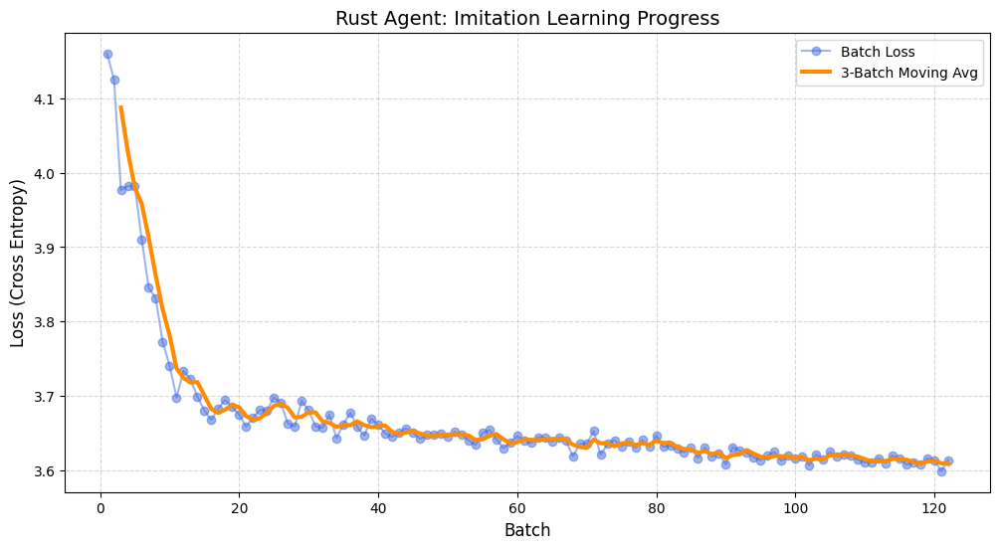

Epoch 1


Epoch 1: 100%|██████████| 122/122 [08:03<00:00,  3.97s/it, loss=3.57]


Epoch 1 | Avg Loss: 3.5991


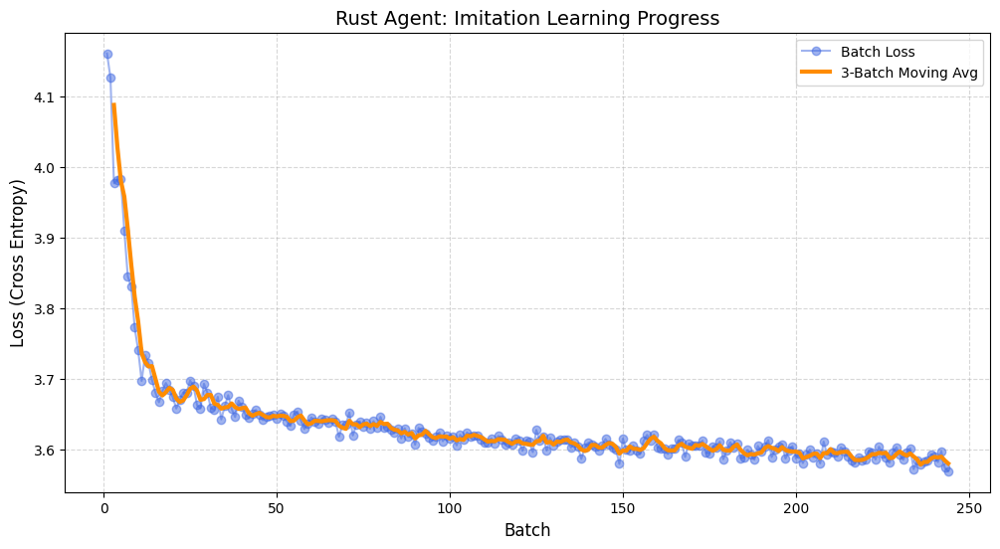

Epoch 2


Epoch 2: 100%|██████████| 122/122 [08:06<00:00,  3.98s/it, loss=3.58]


Epoch 2 | Avg Loss: 3.5785


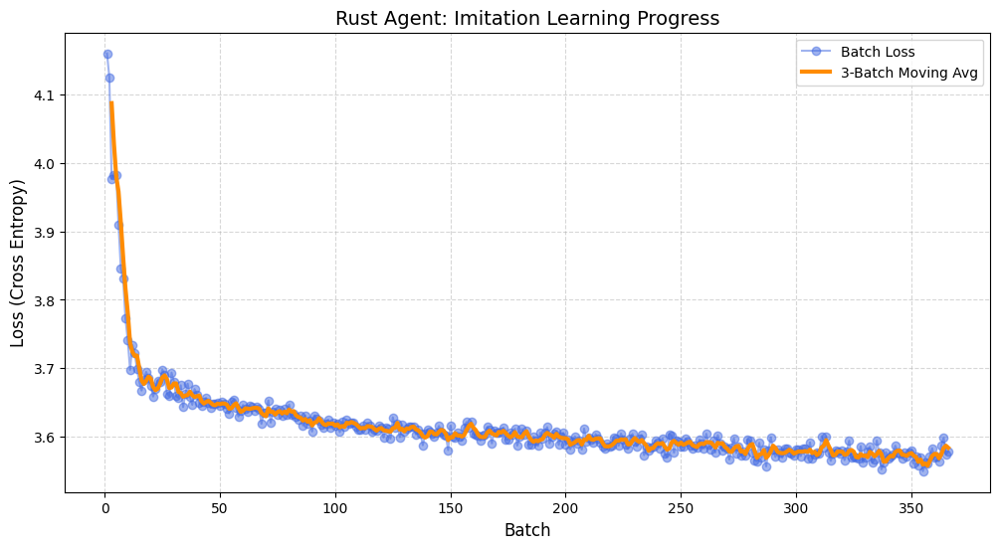

Epoch 3


Epoch 3: 100%|██████████| 122/122 [07:59<00:00,  3.93s/it, loss=3.53]


Epoch 3 | Avg Loss: 3.5527


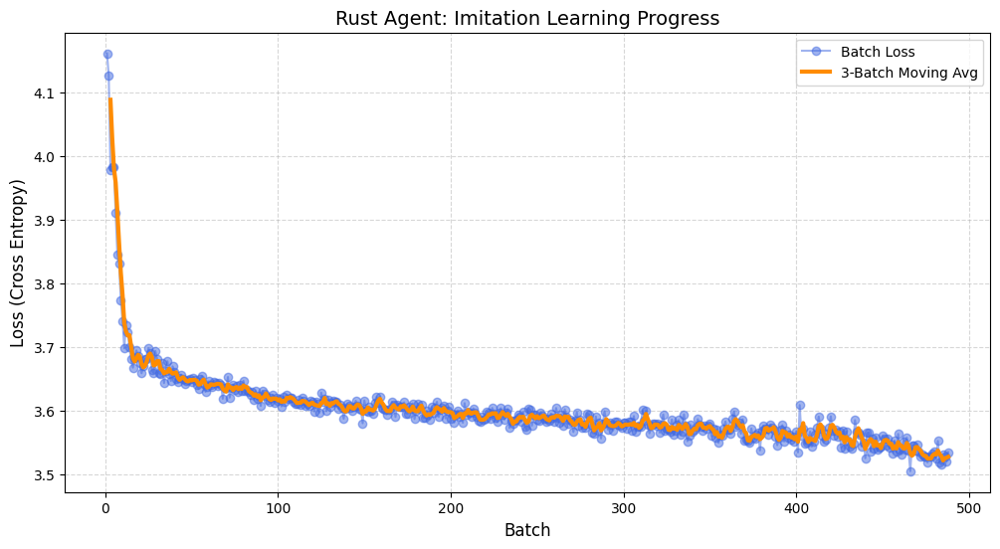

Epoch 4


Epoch 4: 100%|██████████| 122/122 [07:57<00:00,  3.92s/it, loss=3.4]


Epoch 4 | Avg Loss: 3.4598


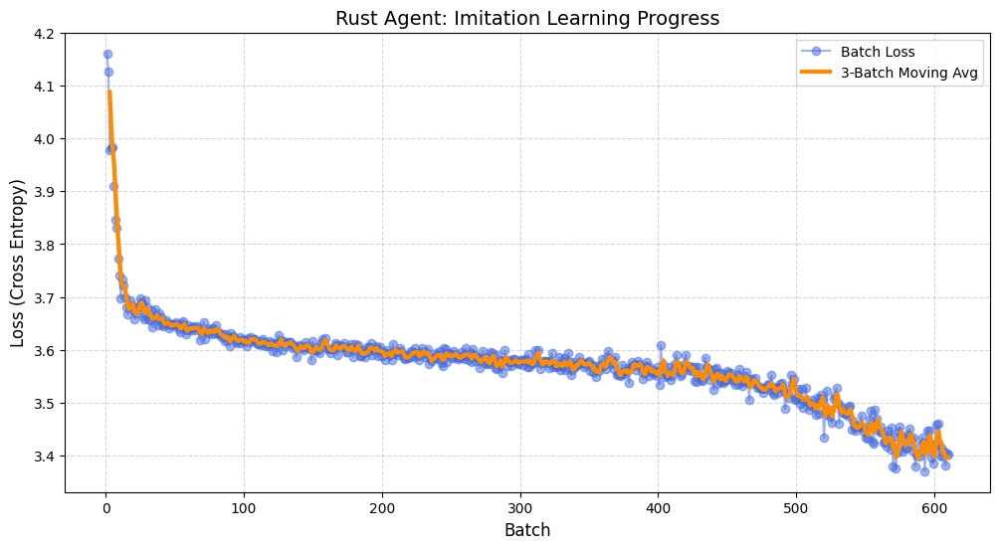

Epoch 5


Epoch 5: 100%|██████████| 122/122 [07:52<00:00,  3.87s/it, loss=3.34]


Epoch 5 | Avg Loss: 3.3764
Checkpoint saved to 1-13_imitation_models/checkpoint_5.pth


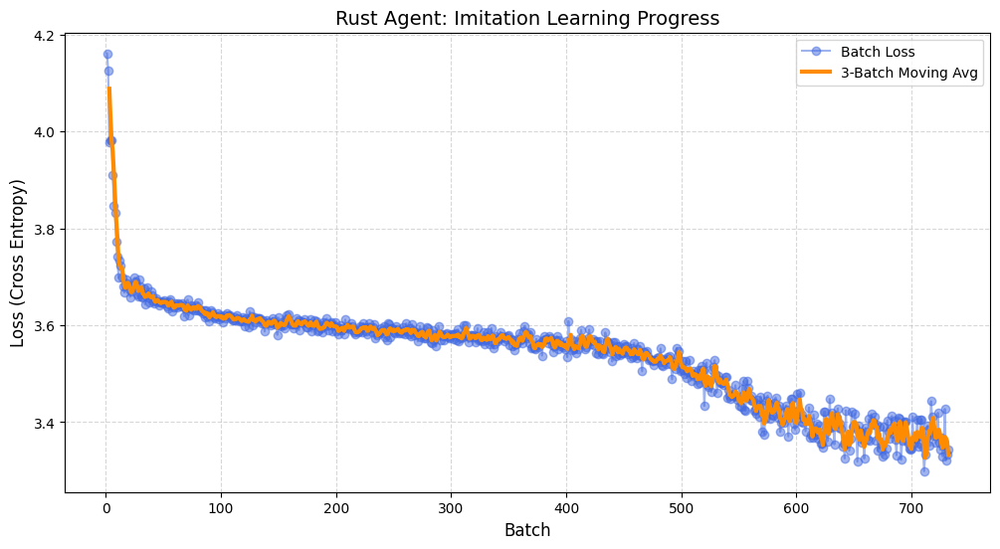

Epoch 6


Epoch 6: 100%|██████████| 122/122 [07:53<00:00,  3.89s/it, loss=3.33]


Epoch 6 | Avg Loss: 3.3469


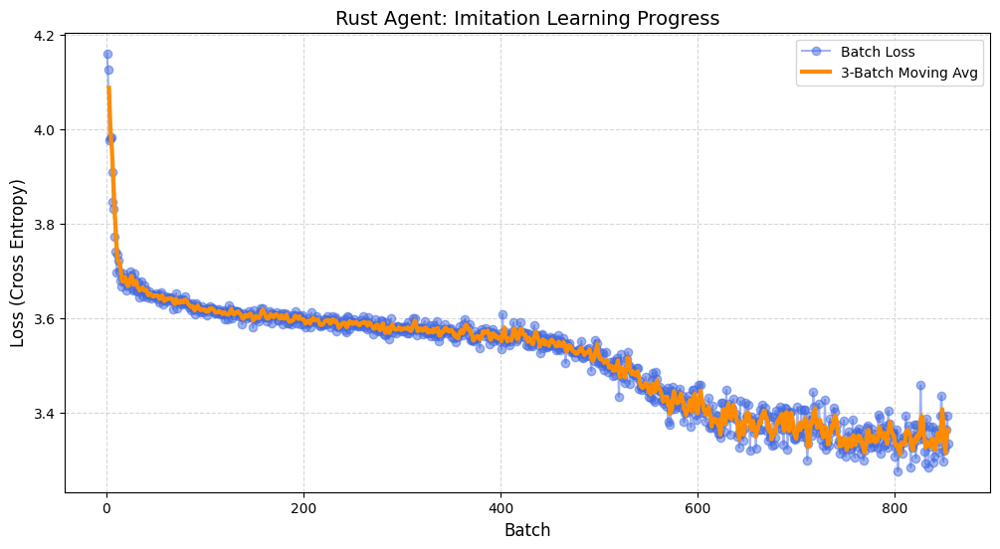

Epoch 7


Epoch 7: 100%|██████████| 122/122 [07:54<00:00,  3.89s/it, loss=3.36]


Epoch 7 | Avg Loss: 3.3354


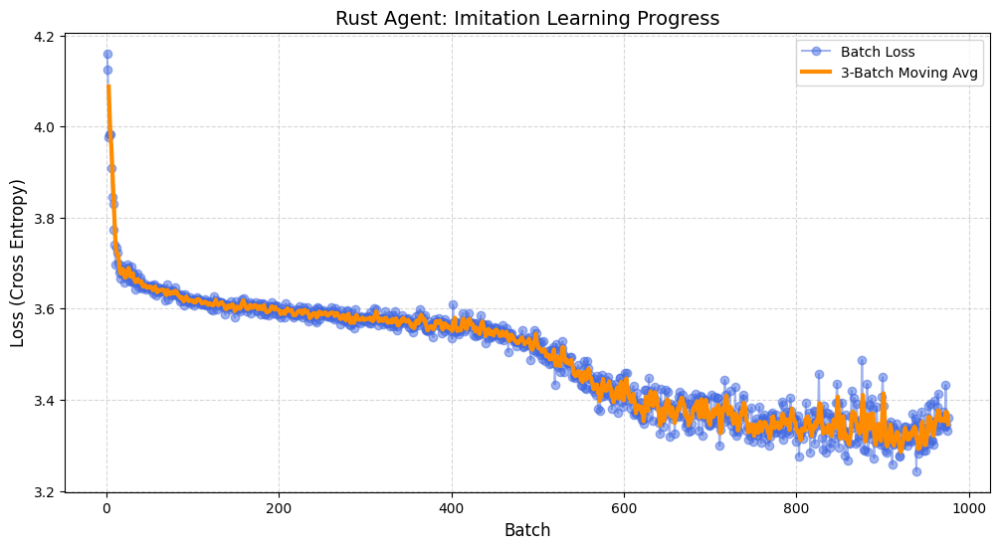

Epoch 8


Epoch 8: 100%|██████████| 122/122 [07:53<00:00,  3.88s/it, loss=3.28]


Epoch 8 | Avg Loss: 3.3211


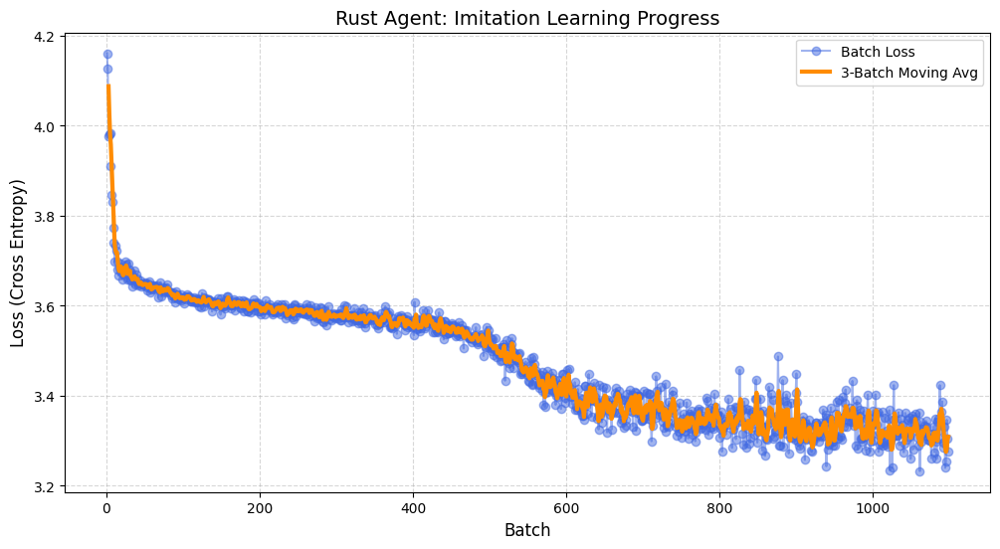

Epoch 9


Epoch 9: 100%|██████████| 122/122 [07:53<00:00,  3.88s/it, loss=3.33]


Epoch 9 | Avg Loss: 3.3113


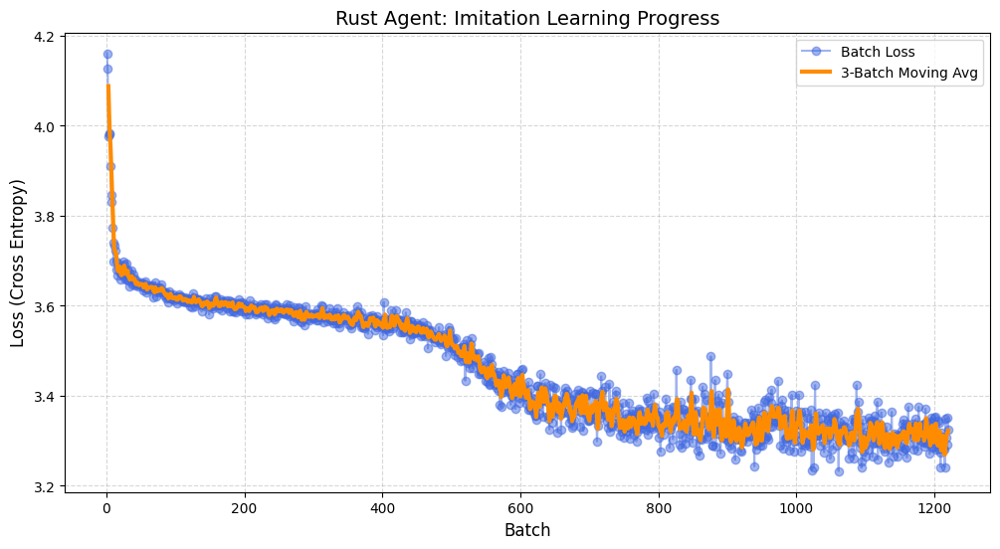

Epoch 10


Epoch 10: 100%|██████████| 122/122 [07:53<00:00,  3.88s/it, loss=3.26]


Epoch 10 | Avg Loss: 3.2948
Checkpoint saved to 1-13_imitation_models/checkpoint_10.pth


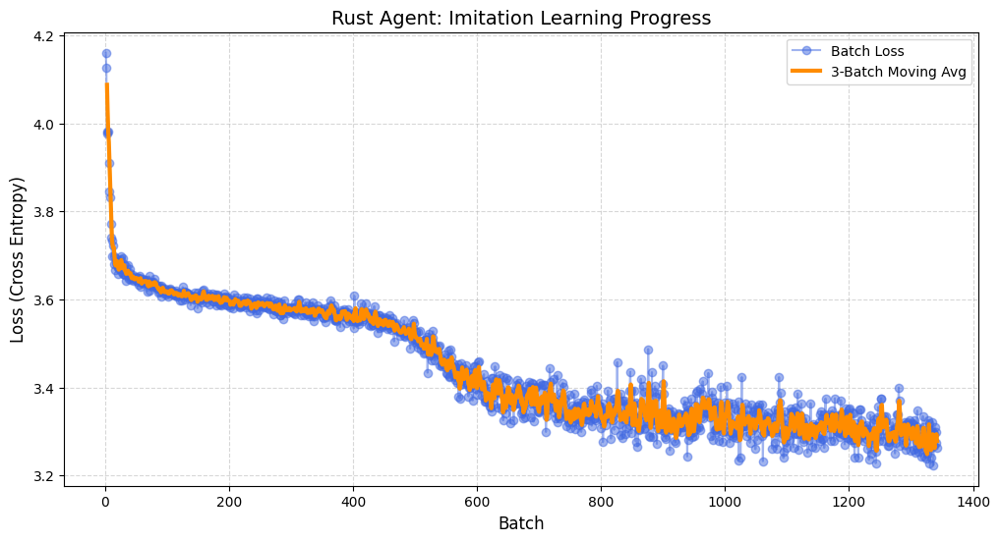

Epoch 11


Epoch 11: 100%|██████████| 122/122 [07:53<00:00,  3.88s/it, loss=3.22]


Epoch 11 | Avg Loss: 3.2763


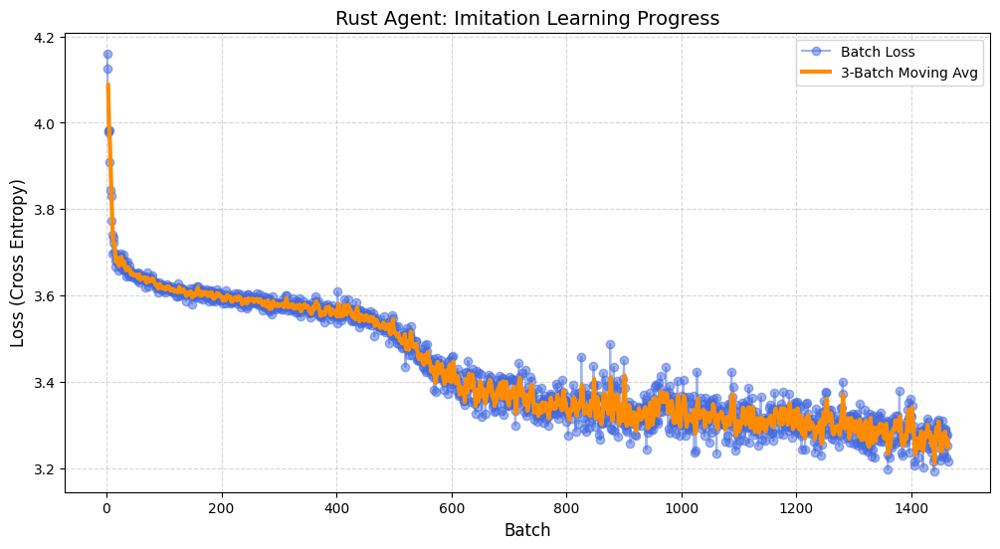

Epoch 12


Epoch 12: 100%|██████████| 122/122 [07:56<00:00,  3.91s/it, loss=3.28]


Epoch 12 | Avg Loss: 3.2702


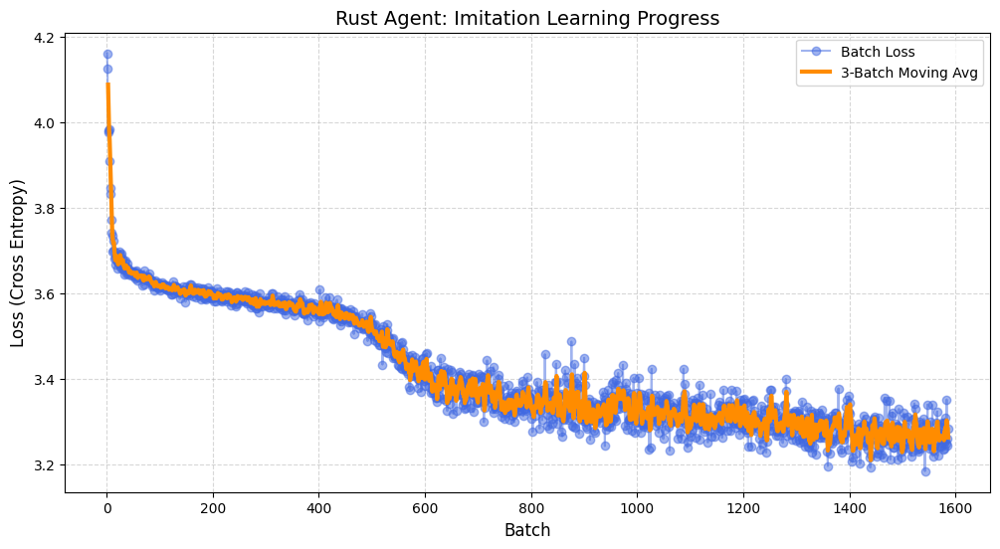

Epoch 13


Epoch 13: 100%|██████████| 122/122 [08:01<00:00,  3.95s/it, loss=3.26]


Epoch 13 | Avg Loss: 3.2597


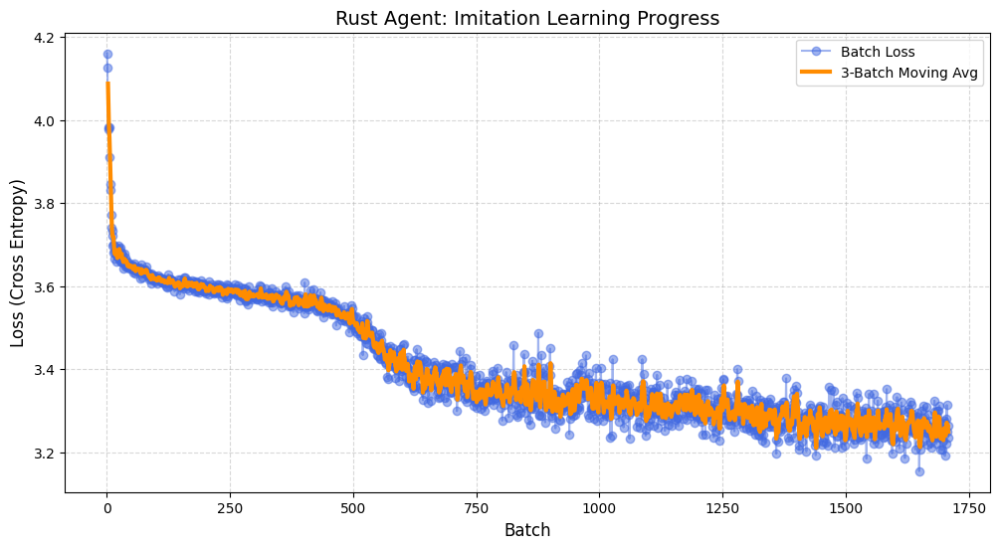

Epoch 14


Epoch 14: 100%|██████████| 122/122 [07:58<00:00,  3.92s/it, loss=3.22]


Epoch 14 | Avg Loss: 3.2475


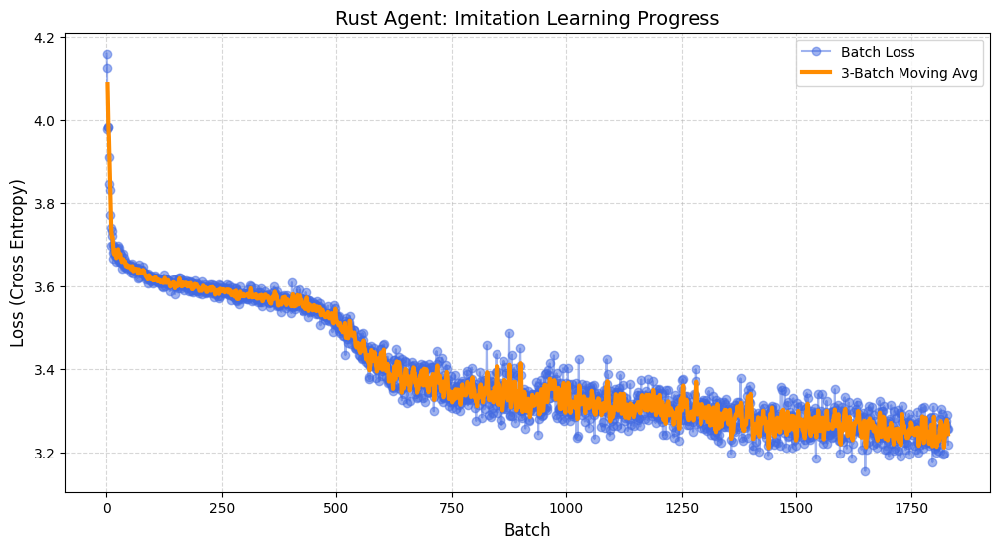

Epoch 15


Epoch 15: 100%|██████████| 122/122 [07:56<00:00,  3.90s/it, loss=3.21]


Epoch 15 | Avg Loss: 3.2491
Checkpoint saved to 1-13_imitation_models/checkpoint_15.pth


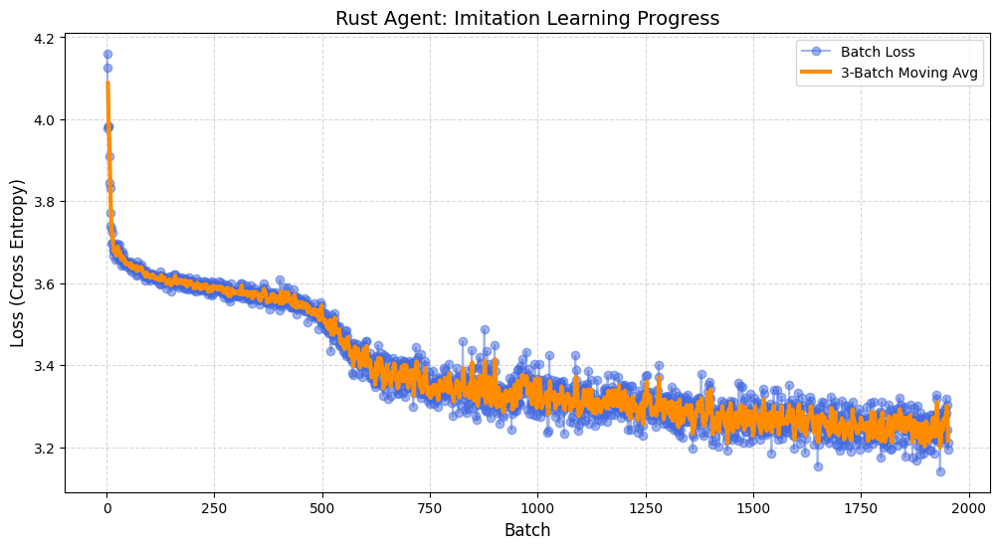

Epoch 16


Epoch 16: 100%|██████████| 122/122 [07:56<00:00,  3.90s/it, loss=3.18]


Epoch 16 | Avg Loss: 3.2377


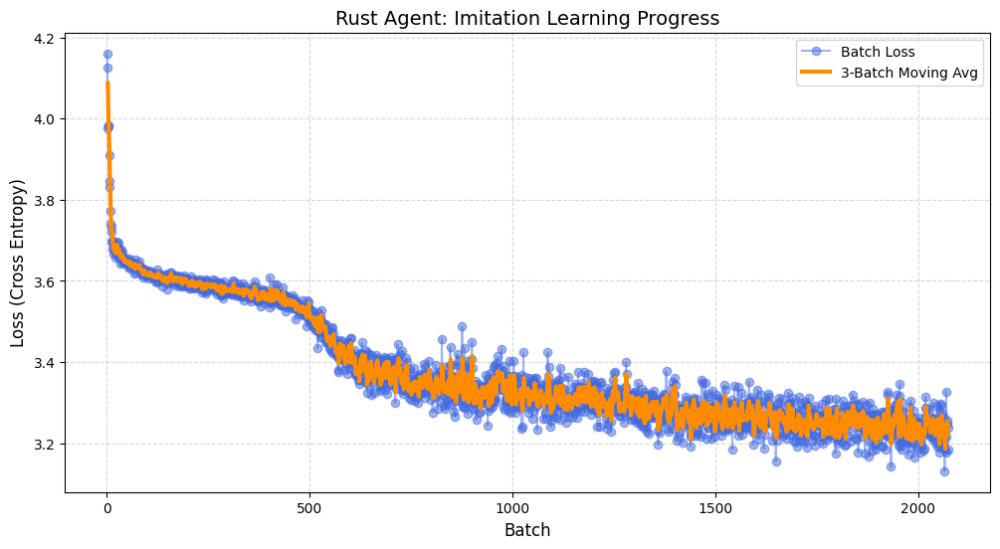

Epoch 17


Epoch 17: 100%|██████████| 122/122 [07:54<00:00,  3.89s/it, loss=3.17]


Epoch 17 | Avg Loss: 3.2201


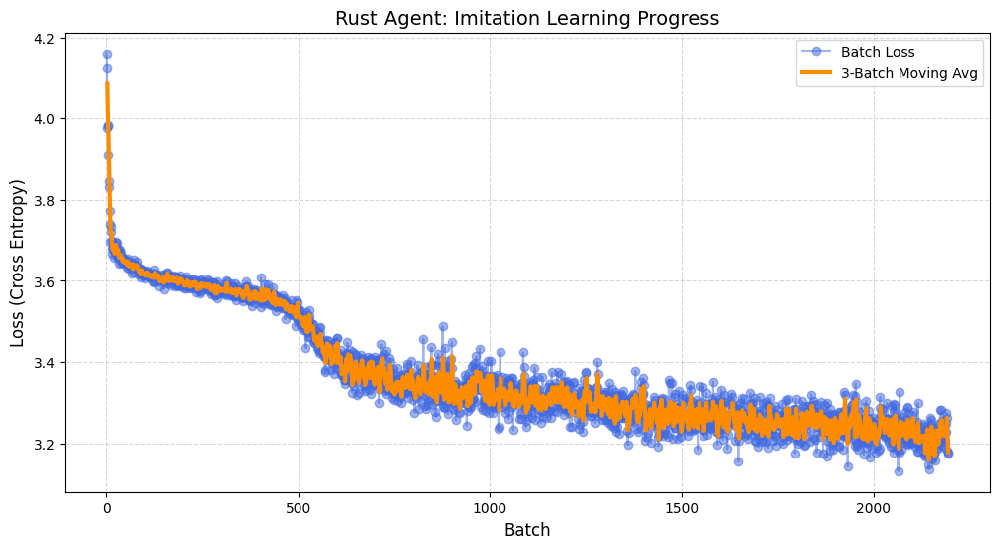

Epoch 18


Epoch 18: 100%|██████████| 122/122 [07:54<00:00,  3.89s/it, loss=3.24]


Epoch 18 | Avg Loss: 3.2160


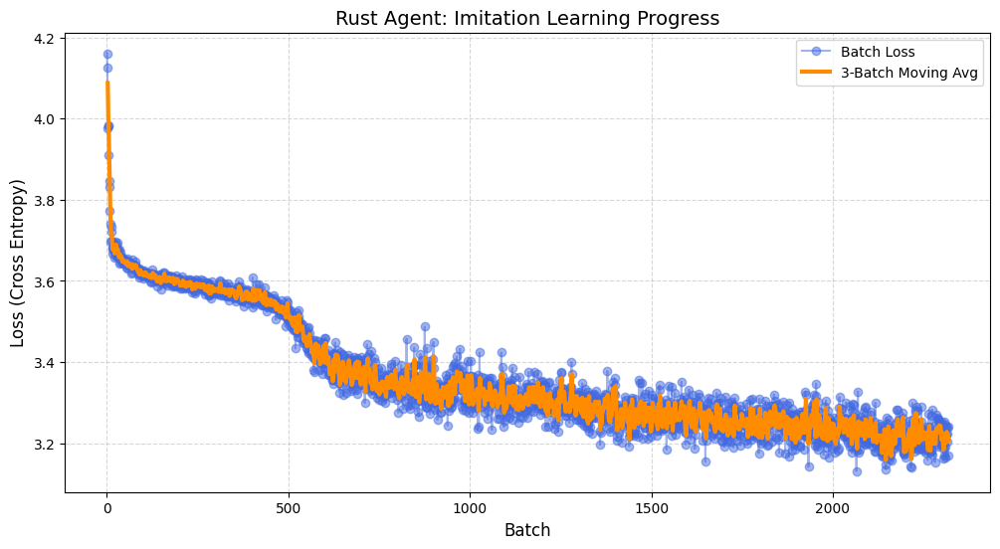

Epoch 19


Epoch 19: 100%|██████████| 122/122 [07:50<00:00,  3.86s/it, loss=3.18]


Epoch 19 | Avg Loss: 3.1991


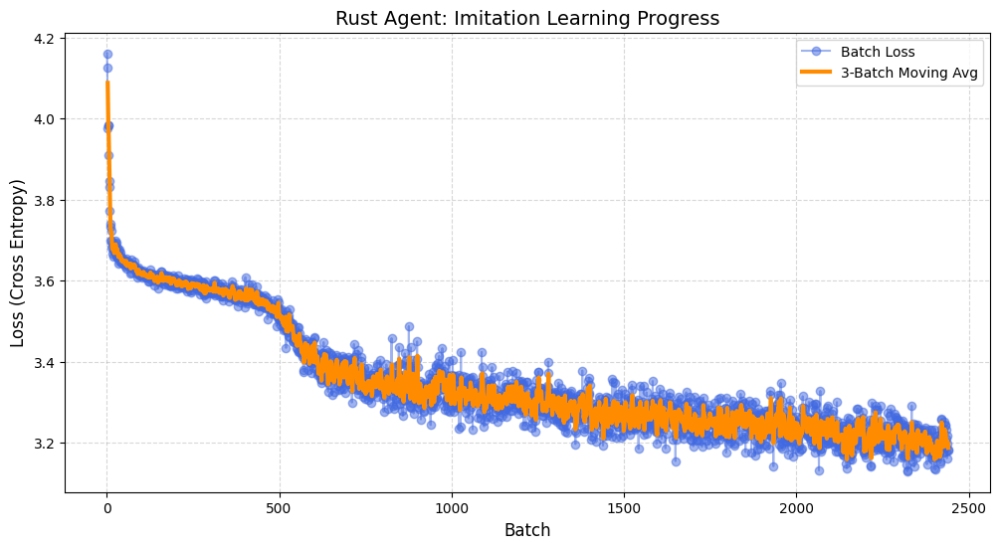

Epoch 20


Epoch 20: 100%|██████████| 122/122 [07:53<00:00,  3.88s/it, loss=3.19]


Epoch 20 | Avg Loss: 3.1956
Checkpoint saved to 1-13_imitation_models/checkpoint_20.pth


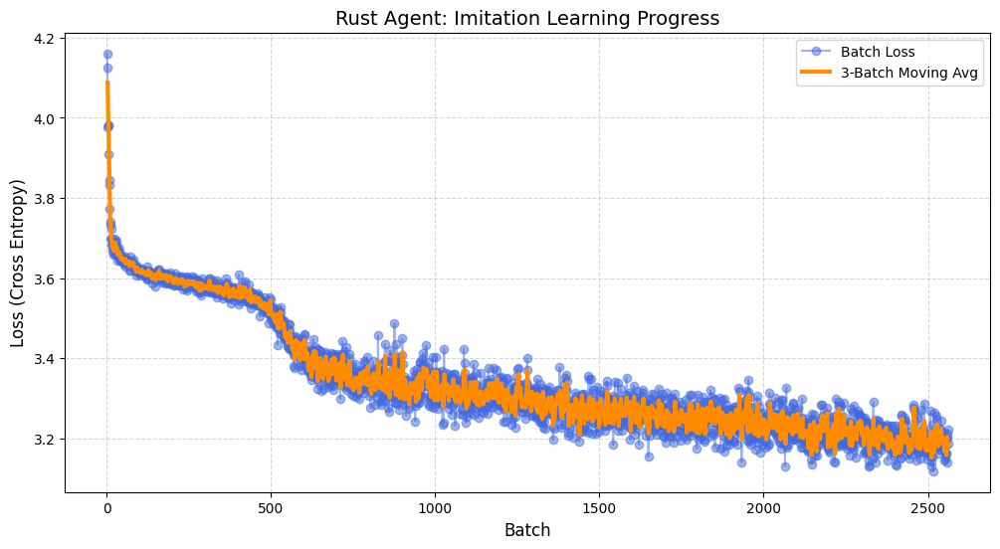

Epoch 21


Epoch 21: 100%|██████████| 122/122 [07:58<00:00,  3.92s/it, loss=3.18]


Epoch 21 | Avg Loss: 3.1925


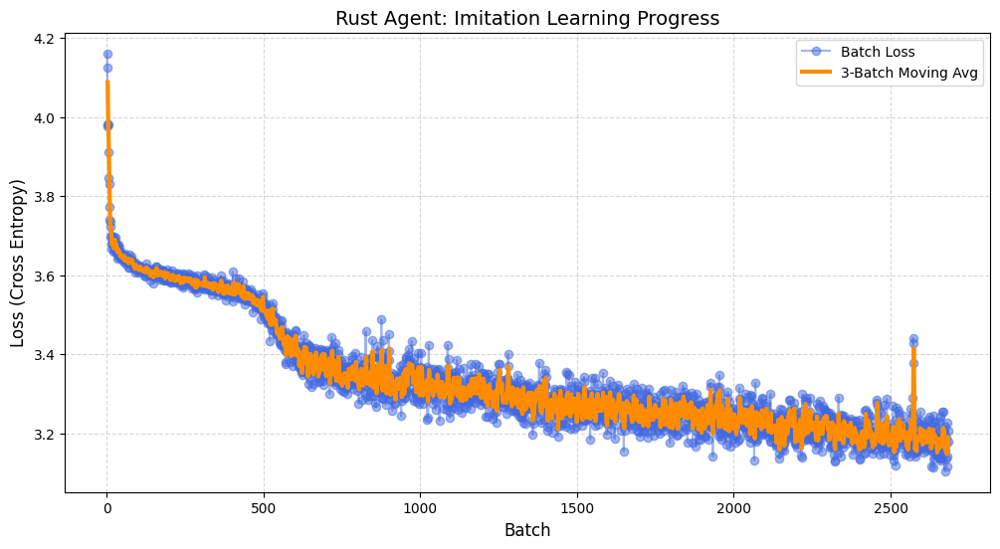

Epoch 22


Epoch 22: 100%|██████████| 122/122 [07:52<00:00,  3.87s/it, loss=3.19]


Epoch 22 | Avg Loss: 3.1669


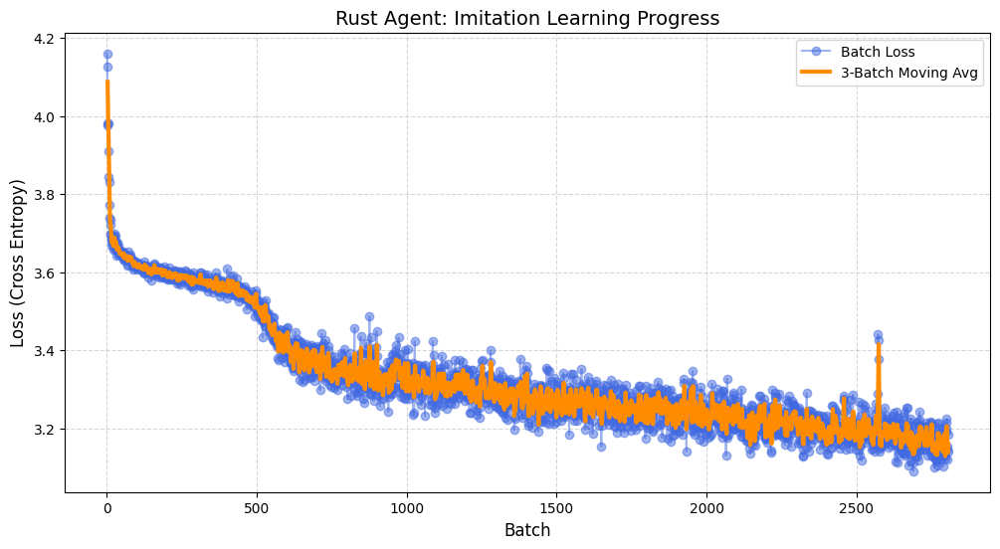

Epoch 23


Epoch 23: 100%|██████████| 122/122 [07:57<00:00,  3.92s/it, loss=3.13]


Epoch 23 | Avg Loss: 3.1613


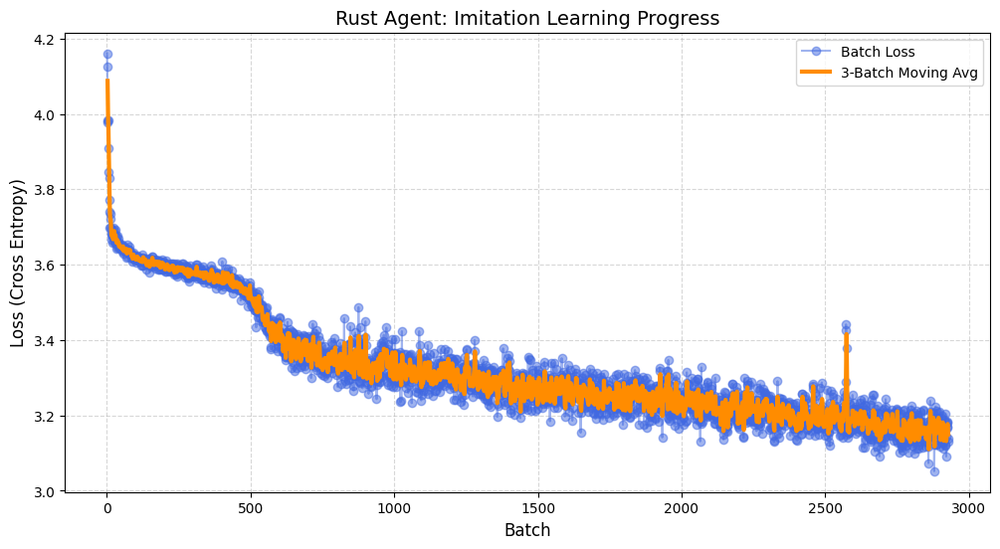

Epoch 24


Epoch 24: 100%|██████████| 122/122 [08:02<00:00,  3.95s/it, loss=3.14]


Epoch 24 | Avg Loss: 3.1538


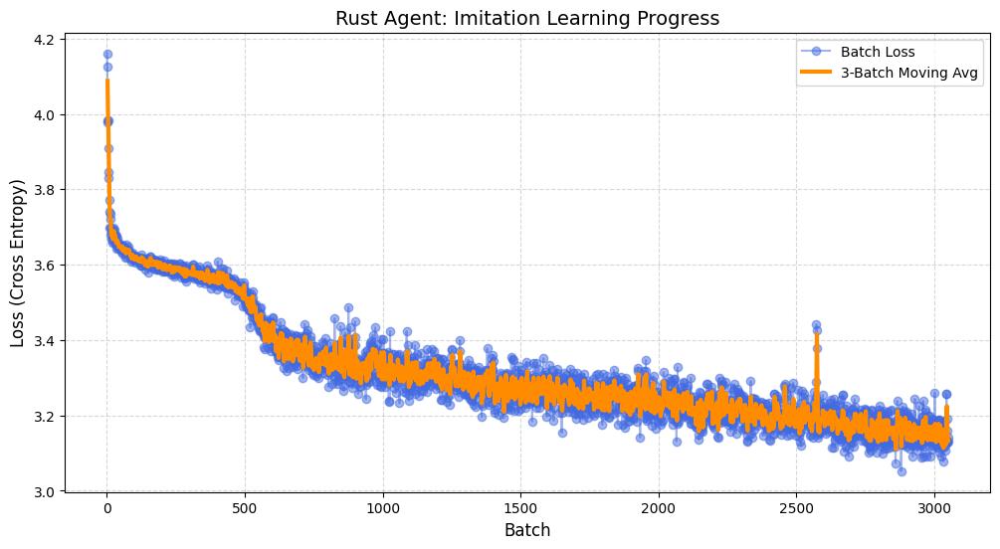

Epoch 25


Epoch 25: 100%|██████████| 122/122 [07:54<00:00,  3.89s/it, loss=3.15]


Epoch 25 | Avg Loss: 3.1477
Checkpoint saved to 1-13_imitation_models/checkpoint_25.pth


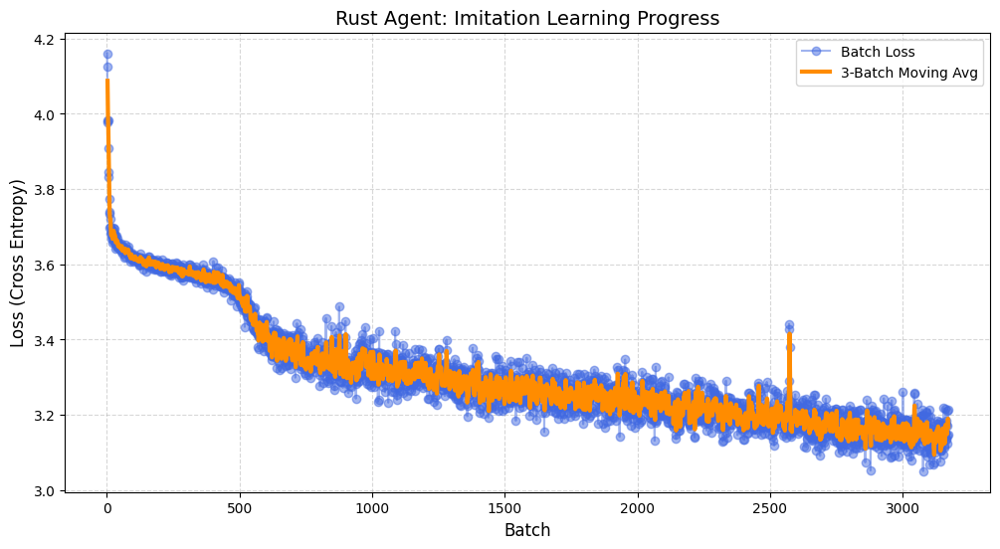

Epoch 26


Epoch 26: 100%|██████████| 122/122 [08:00<00:00,  3.94s/it, loss=3.14]


Epoch 26 | Avg Loss: 3.1540


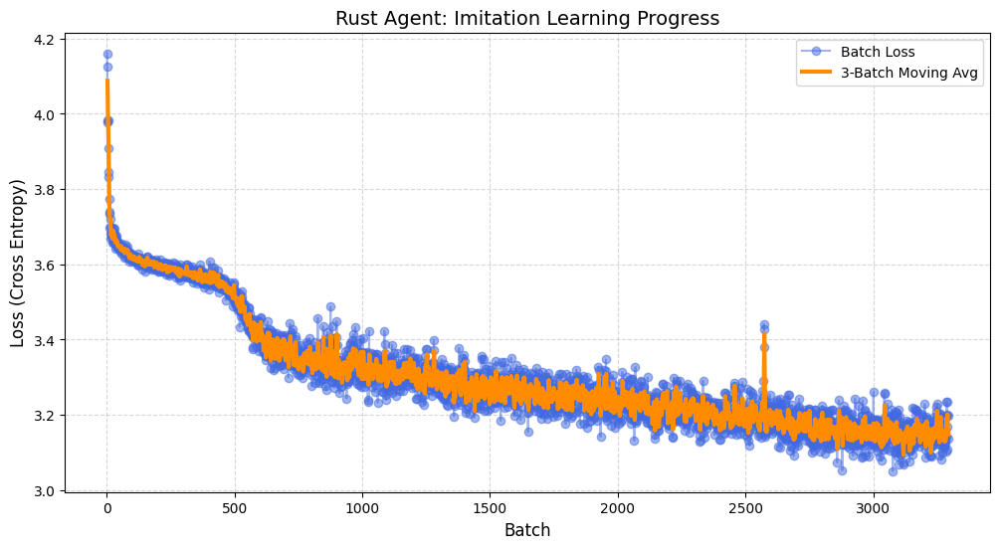

Epoch 27


Epoch 27: 100%|██████████| 122/122 [07:56<00:00,  3.90s/it, loss=3.11]


Epoch 27 | Avg Loss: 3.1436


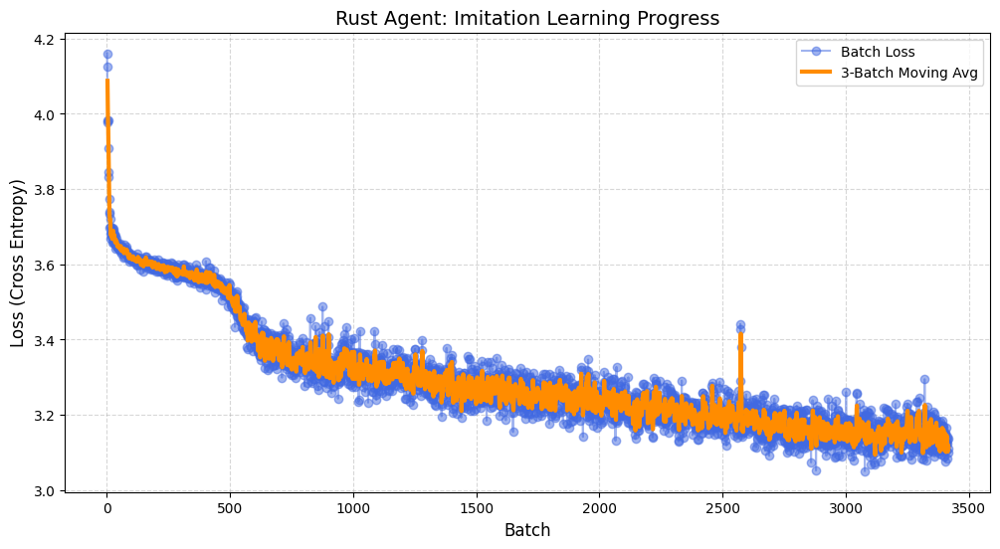

Epoch 28


Epoch 28: 100%|██████████| 122/122 [07:55<00:00,  3.90s/it, loss=3.12]


Epoch 28 | Avg Loss: 3.1140


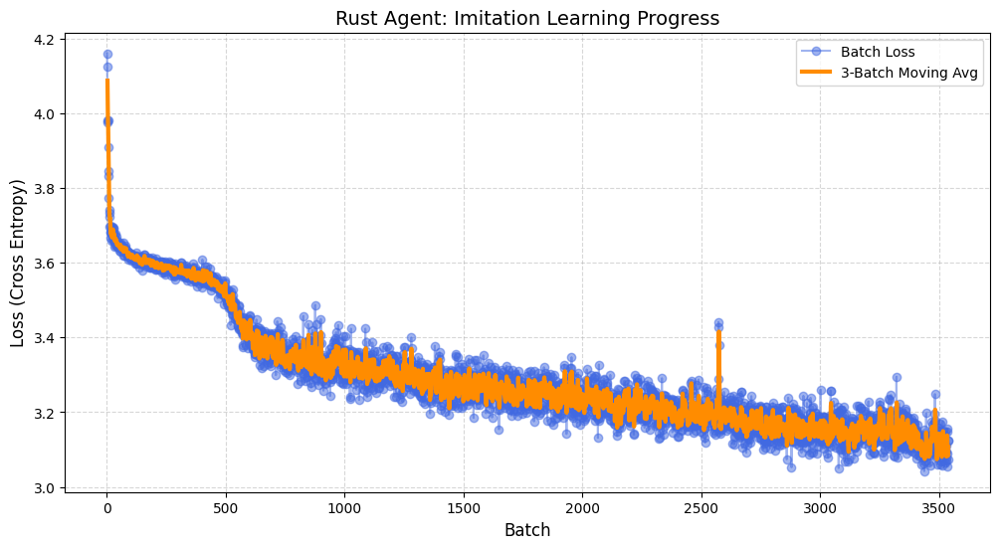

Epoch 29


Epoch 29: 100%|██████████| 122/122 [07:59<00:00,  3.93s/it, loss=3.05]


Epoch 29 | Avg Loss: 3.1102


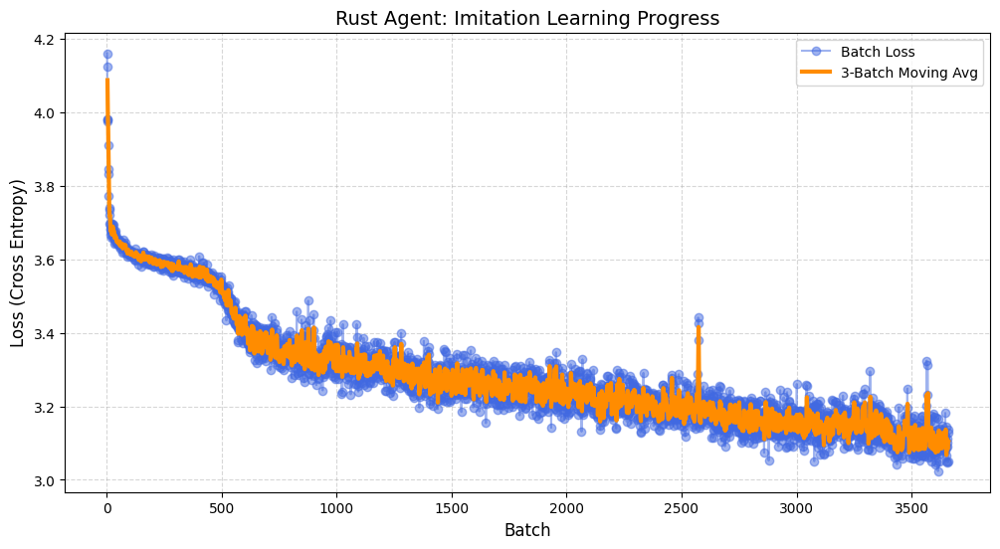

Epoch 30


Epoch 30: 100%|██████████| 122/122 [07:59<00:00,  3.93s/it, loss=3.13]


Epoch 30 | Avg Loss: 3.1015
Checkpoint saved to 1-13_imitation_models/checkpoint_30.pth


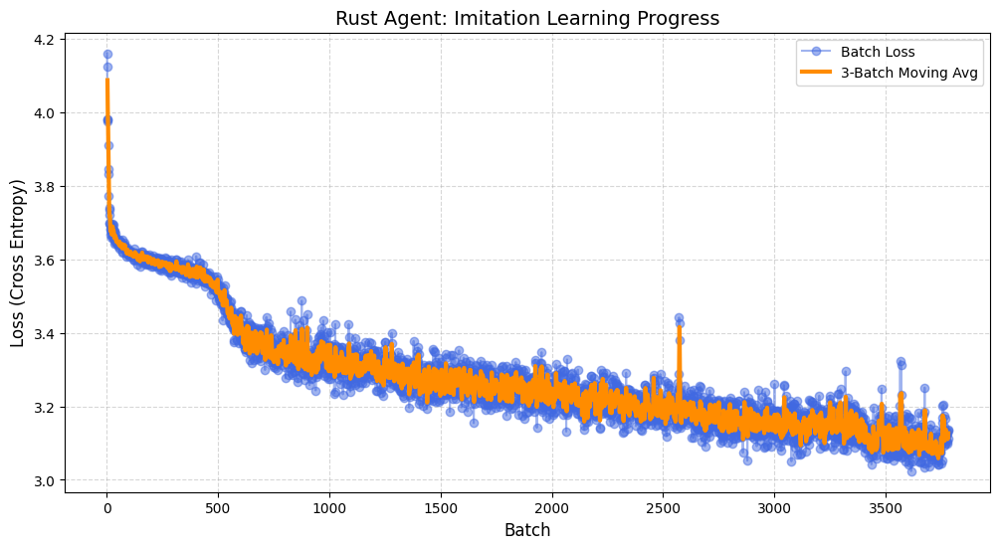

Epoch 31


Epoch 31: 100%|██████████| 122/122 [08:00<00:00,  3.94s/it, loss=3.06]


Epoch 31 | Avg Loss: 3.0849


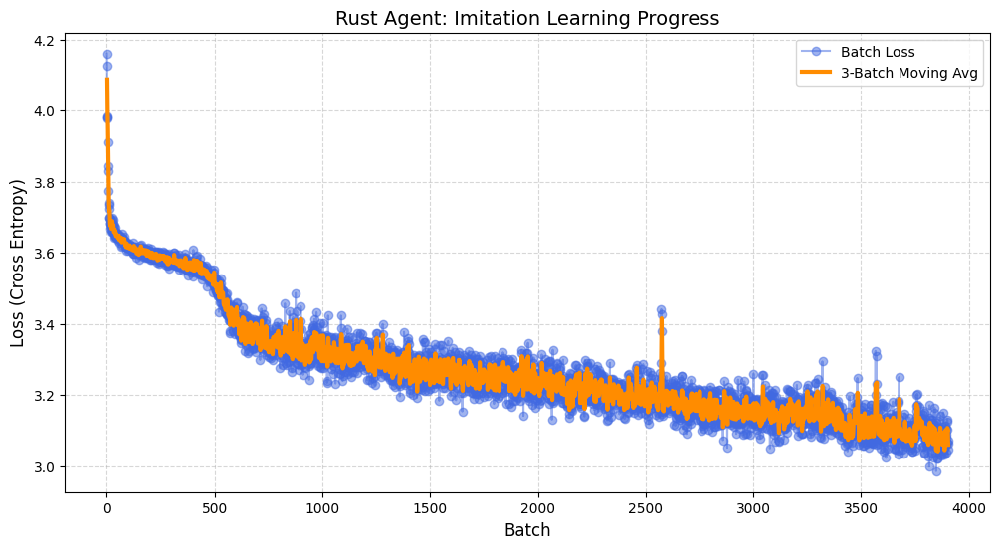

Epoch 32


Epoch 32: 100%|██████████| 122/122 [07:58<00:00,  3.92s/it, loss=3.03]


Epoch 32 | Avg Loss: 3.0715


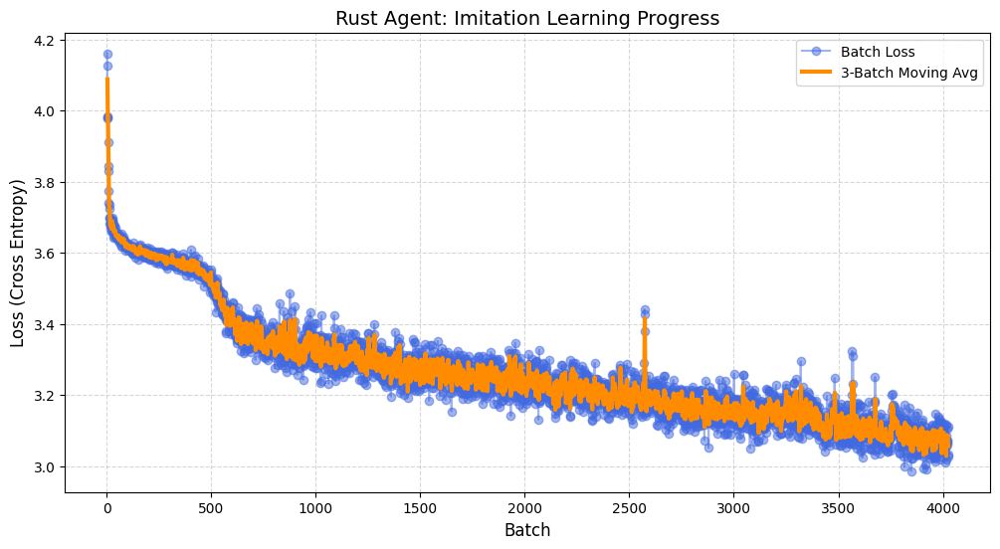

Epoch 33


Epoch 33: 100%|██████████| 122/122 [07:57<00:00,  3.92s/it, loss=3.1]


Epoch 33 | Avg Loss: 3.0819


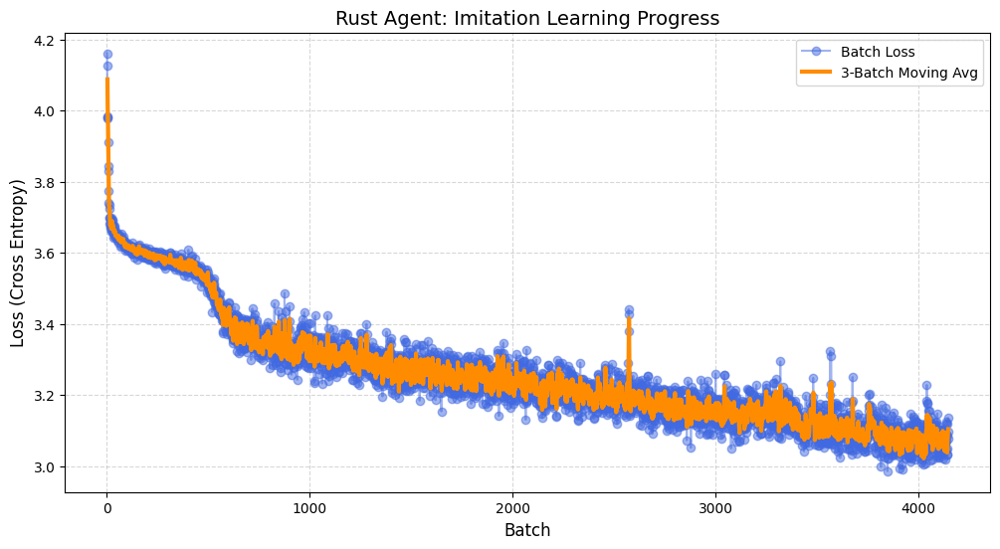

Epoch 34


Epoch 34: 100%|██████████| 122/122 [07:58<00:00,  3.92s/it, loss=3.08]


Epoch 34 | Avg Loss: 3.0592


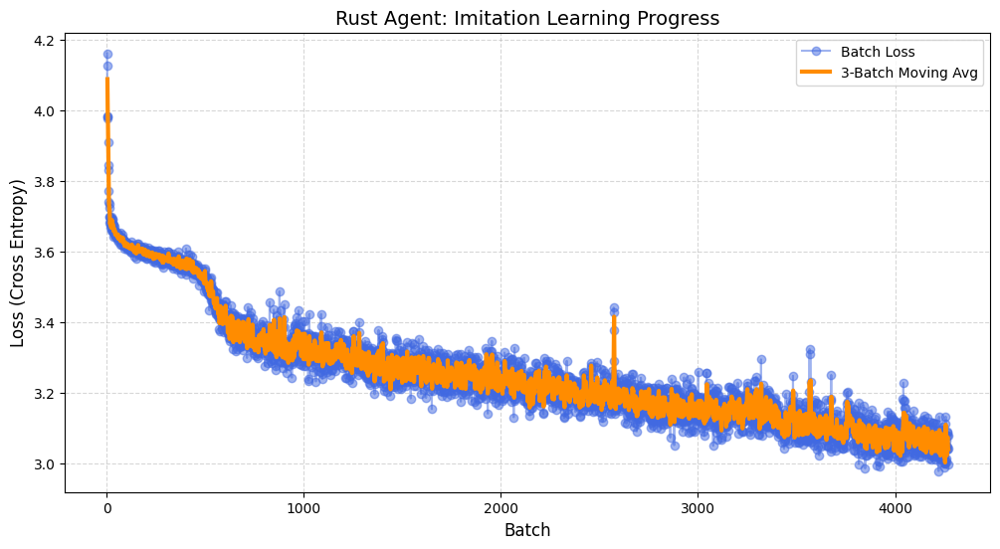

Epoch 35


Epoch 35: 100%|██████████| 122/122 [07:57<00:00,  3.91s/it, loss=3.13]


Epoch 35 | Avg Loss: 3.0732
Checkpoint saved to 1-13_imitation_models/checkpoint_35.pth


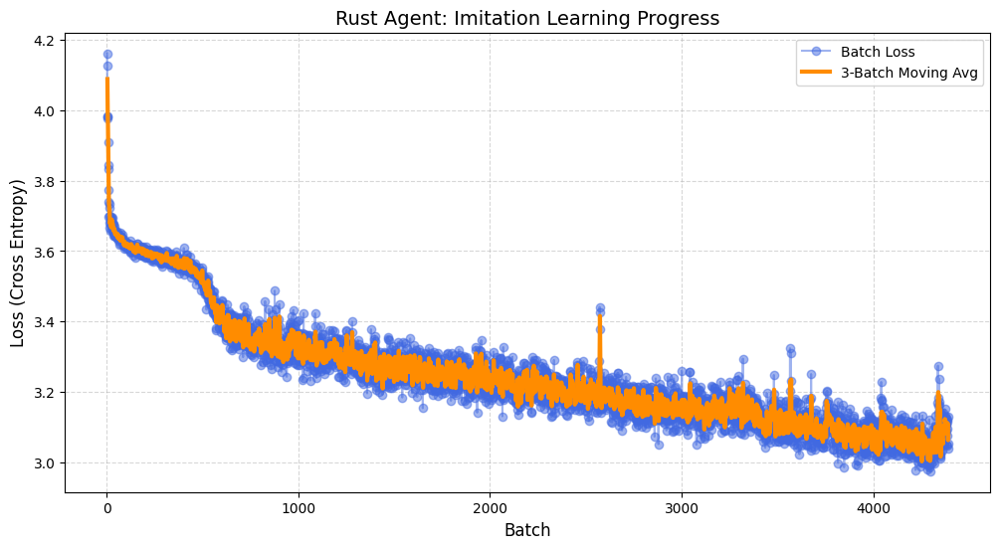

Epoch 36


Epoch 36: 100%|██████████| 122/122 [07:58<00:00,  3.93s/it, loss=3.1]


Epoch 36 | Avg Loss: 3.0856


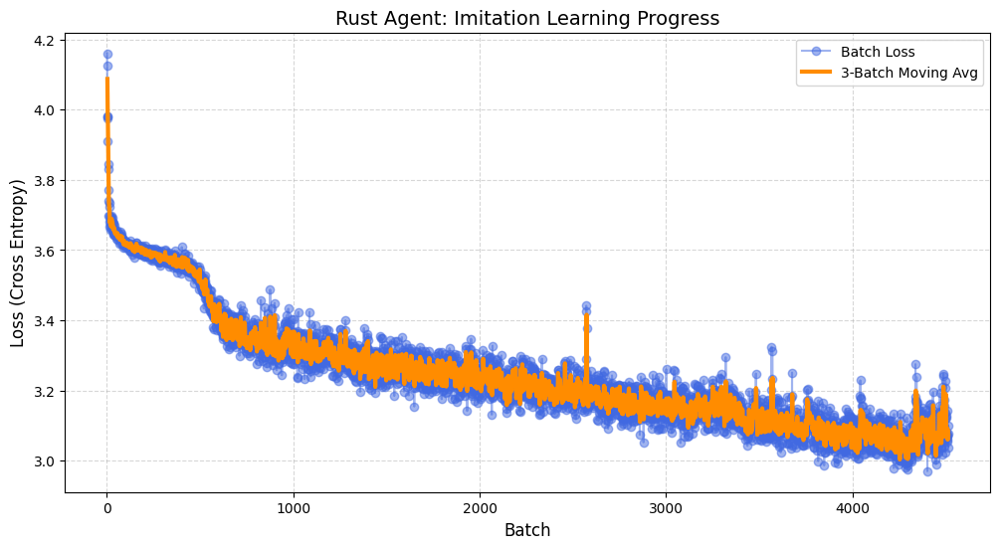

Epoch 37


Epoch 37: 100%|██████████| 122/122 [07:57<00:00,  3.92s/it, loss=3.01]


Epoch 37 | Avg Loss: 3.0458


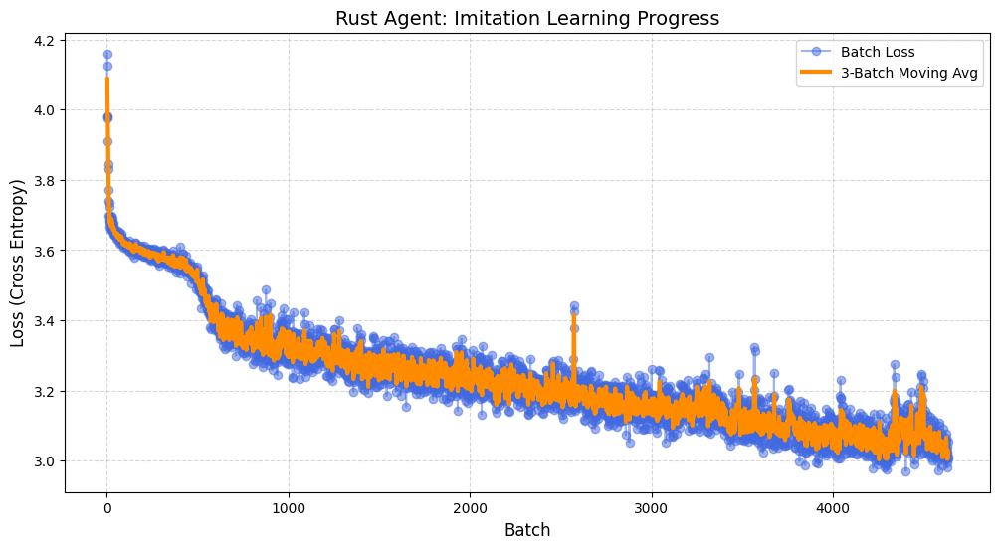

Epoch 38


Epoch 38: 100%|██████████| 122/122 [08:00<00:00,  3.93s/it, loss=2.98]


Epoch 38 | Avg Loss: 3.0278


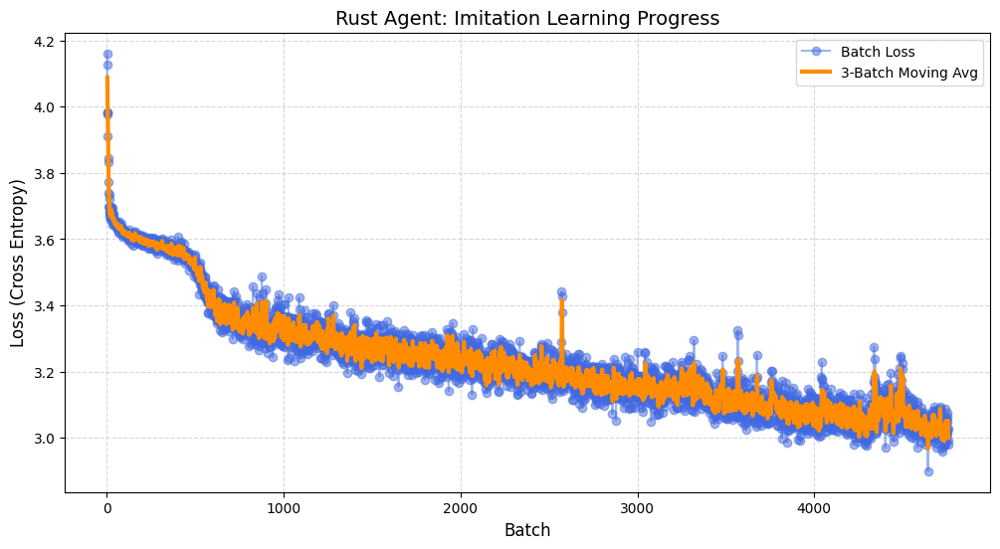

Epoch 39


Epoch 39: 100%|██████████| 122/122 [08:00<00:00,  3.93s/it, loss=3.09]


Epoch 39 | Avg Loss: 3.0675


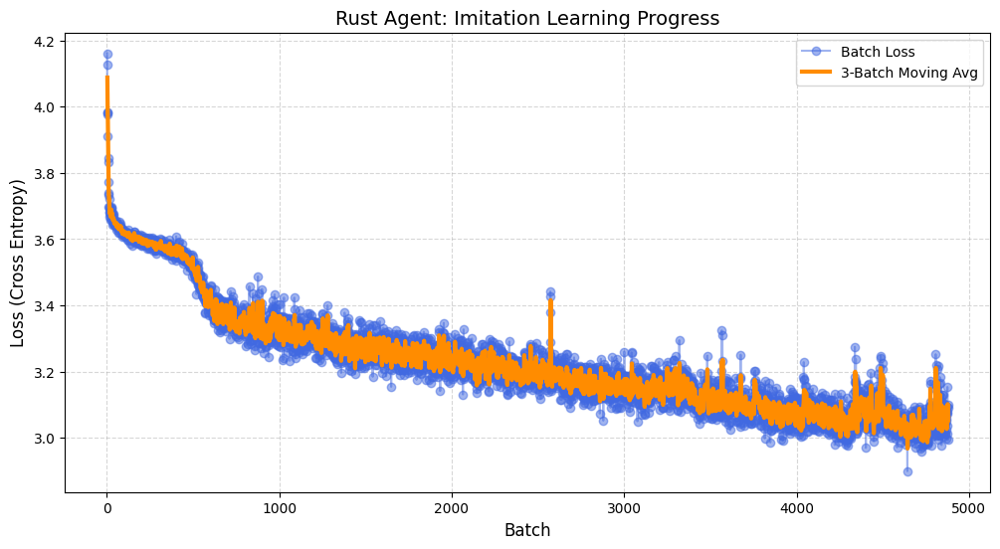

Epoch 40


Epoch 40: 100%|██████████| 122/122 [07:59<00:00,  3.93s/it, loss=3.04]


Epoch 40 | Avg Loss: 3.0342
Checkpoint saved to 1-13_imitation_models/checkpoint_40.pth


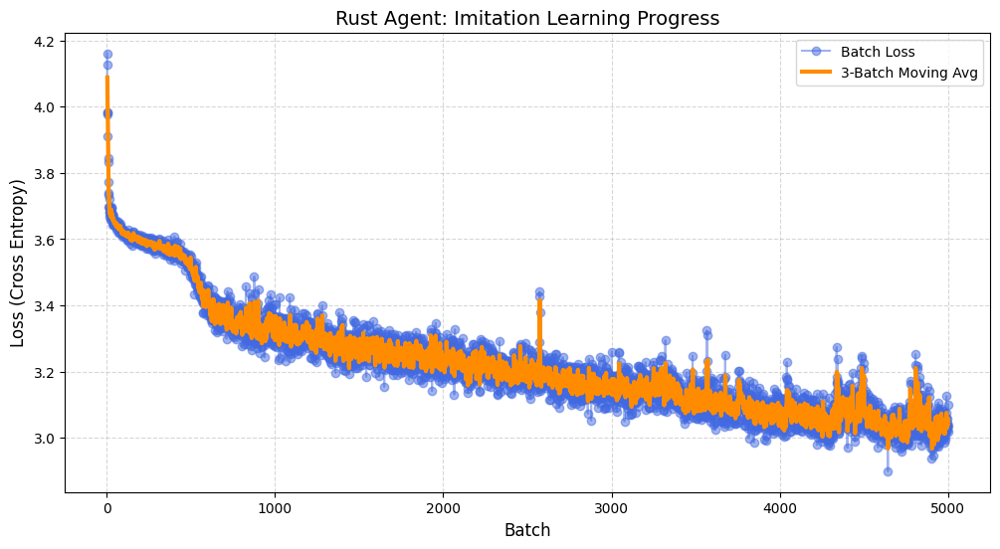

Epoch 41


Epoch 41: 100%|██████████| 122/122 [07:59<00:00,  3.93s/it, loss=2.95]


Epoch 41 | Avg Loss: 3.0141


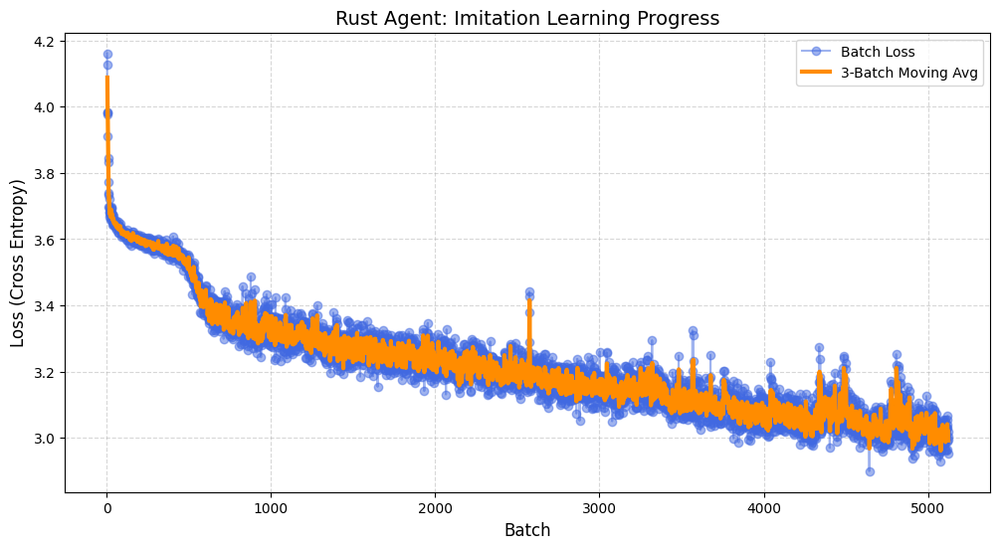

Epoch 42


Epoch 42: 100%|██████████| 122/122 [07:57<00:00,  3.91s/it, loss=3.01]


Epoch 42 | Avg Loss: 2.9924


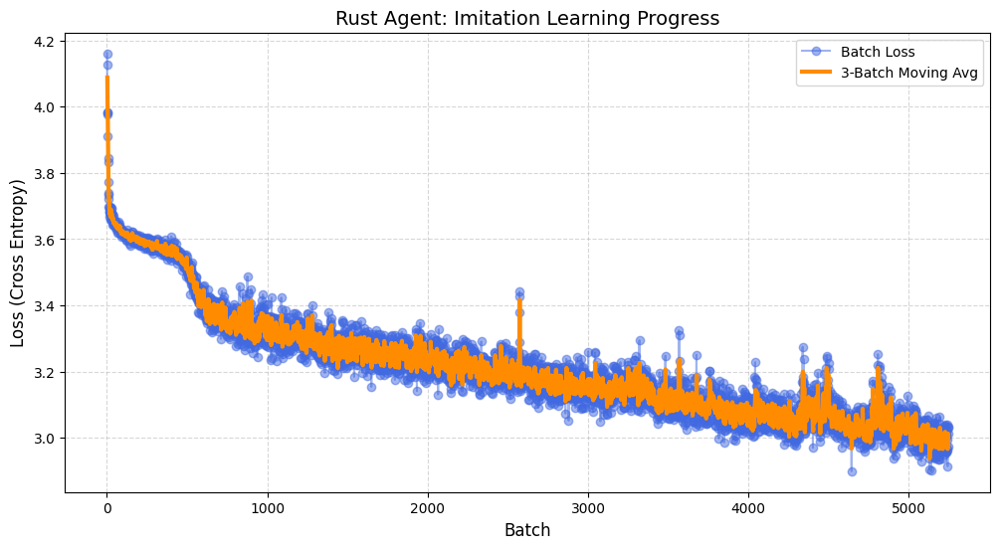

Epoch 43


Epoch 43: 100%|██████████| 122/122 [07:56<00:00,  3.90s/it, loss=3.01]


Epoch 43 | Avg Loss: 2.9830


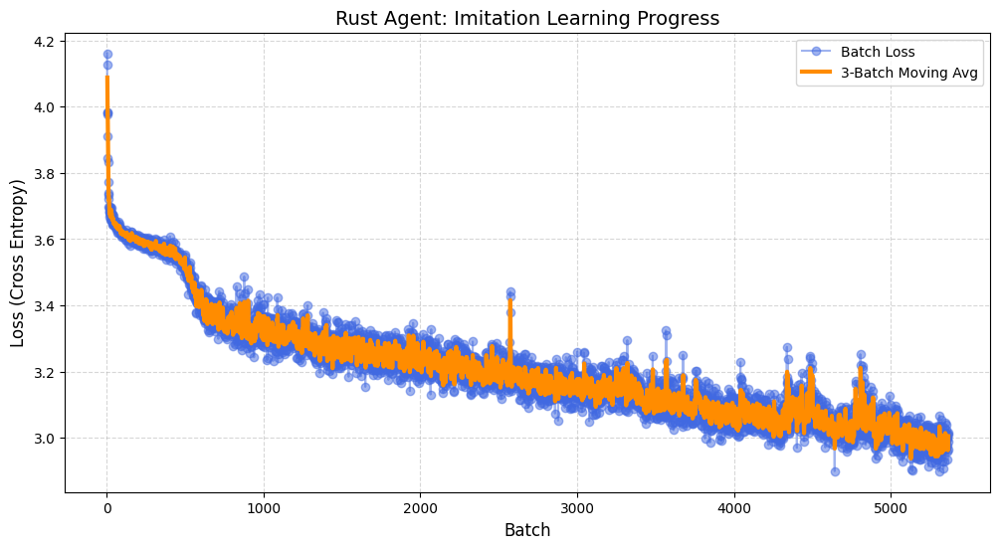

Epoch 44


Epoch 44: 100%|██████████| 122/122 [07:56<00:00,  3.91s/it, loss=2.94]


Epoch 44 | Avg Loss: 2.9722


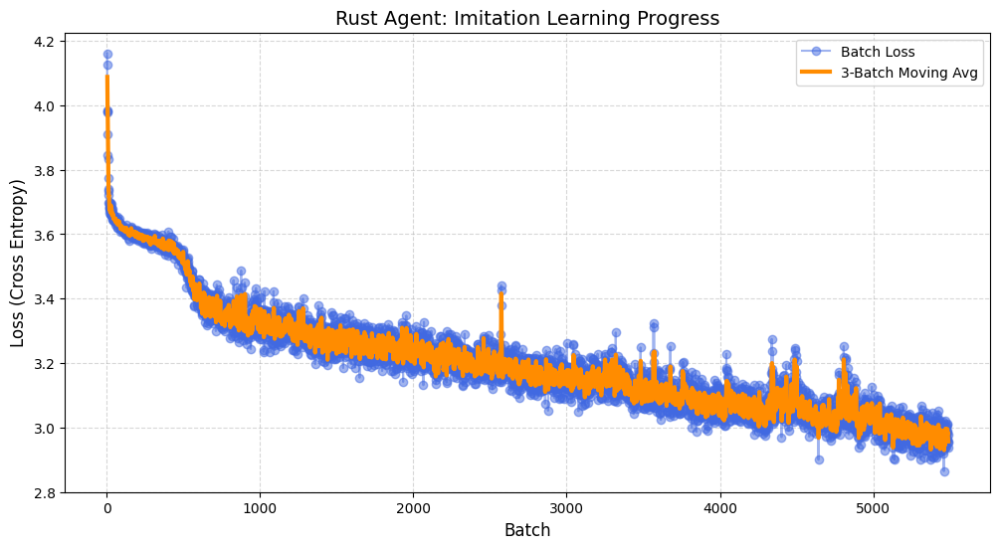

Epoch 45


Epoch 45: 100%|██████████| 122/122 [07:59<00:00,  3.93s/it, loss=2.98]


Epoch 45 | Avg Loss: 2.9647
Checkpoint saved to 1-13_imitation_models/checkpoint_45.pth


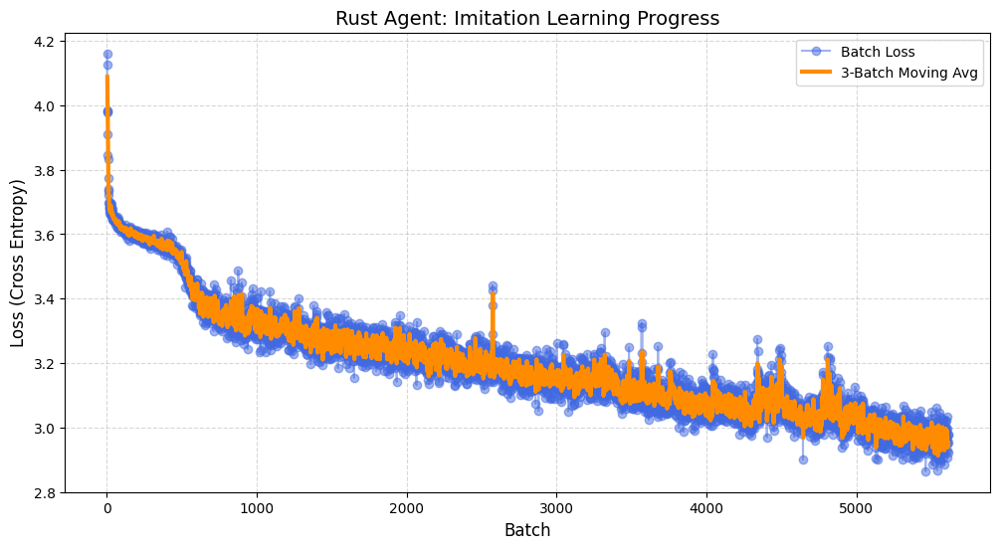

Epoch 46


Epoch 46: 100%|██████████| 122/122 [08:00<00:00,  3.94s/it, loss=2.98]


Epoch 46 | Avg Loss: 2.9603


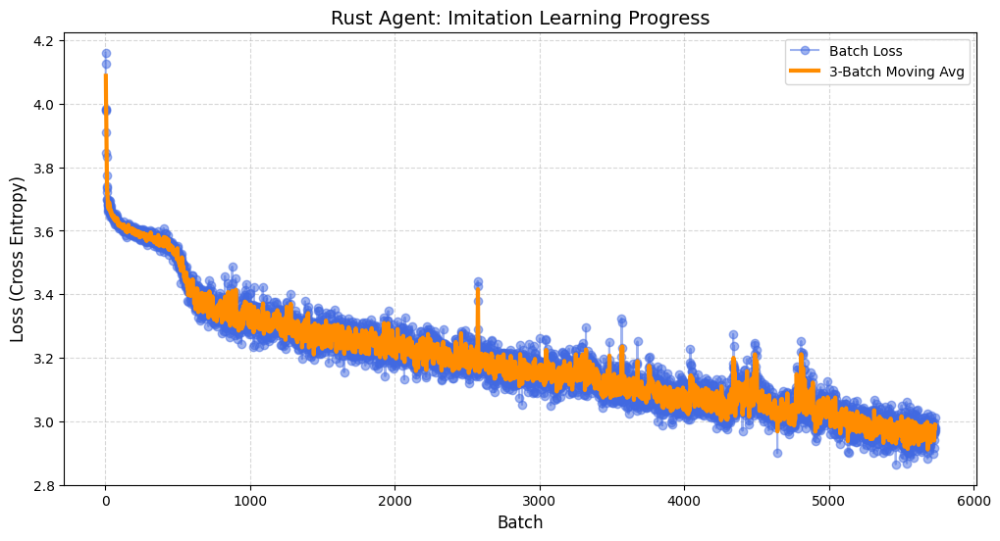

Epoch 47


Epoch 47: 100%|██████████| 122/122 [07:56<00:00,  3.91s/it, loss=2.91]


Epoch 47 | Avg Loss: 2.9489


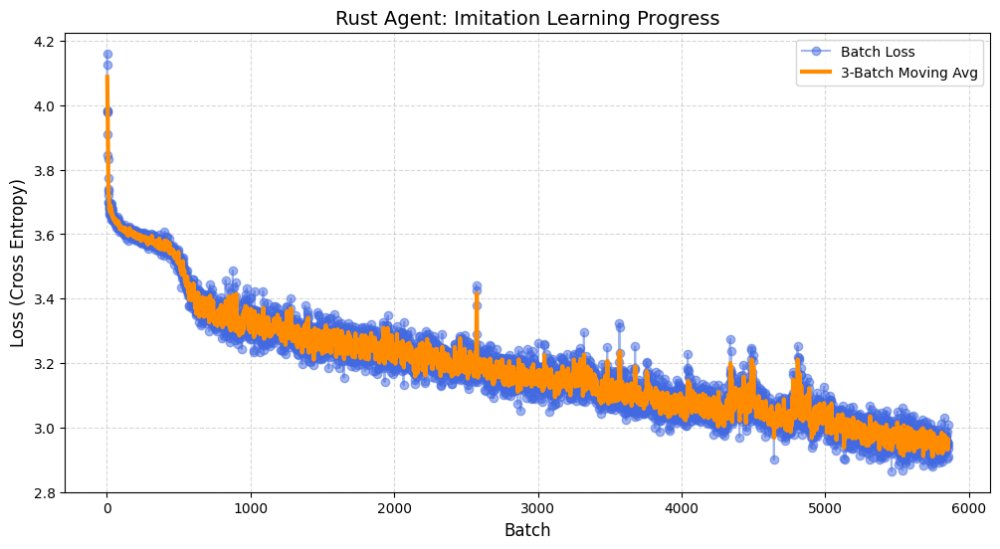

Epoch 48


Epoch 48: 100%|██████████| 122/122 [07:57<00:00,  3.91s/it, loss=2.96]


Epoch 48 | Avg Loss: 2.9572


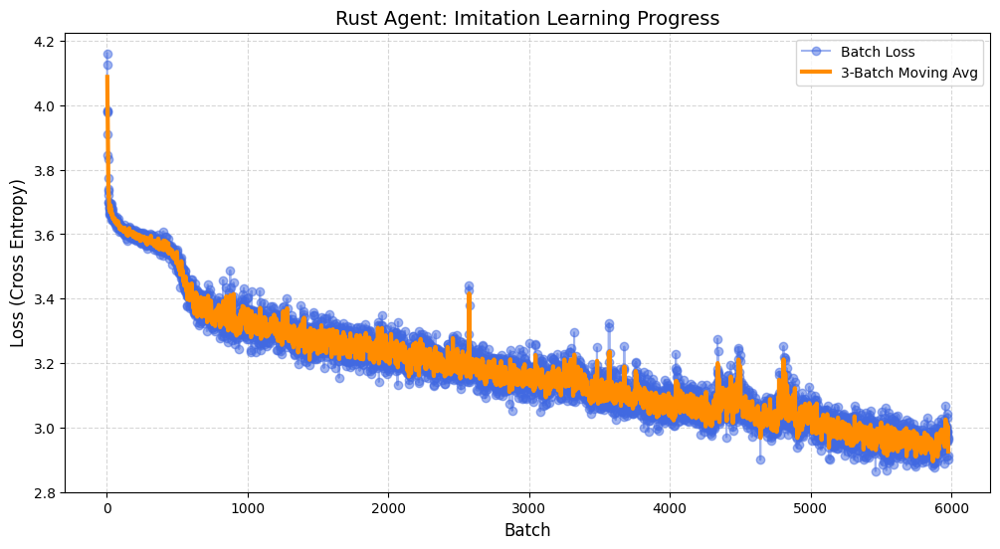

Epoch 49


Epoch 49: 100%|██████████| 122/122 [07:58<00:00,  3.93s/it, loss=3.01]


Epoch 49 | Avg Loss: 2.9591


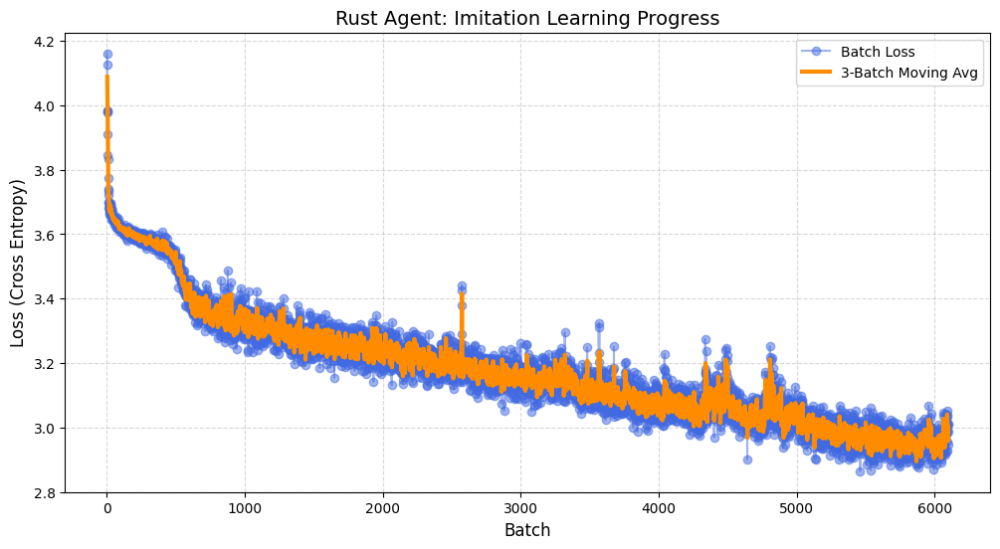

Epoch 50


Epoch 50: 100%|██████████| 122/122 [07:53<00:00,  3.88s/it, loss=2.91]


Epoch 50 | Avg Loss: 2.9490
Checkpoint saved to 1-13_imitation_models/checkpoint_50.pth


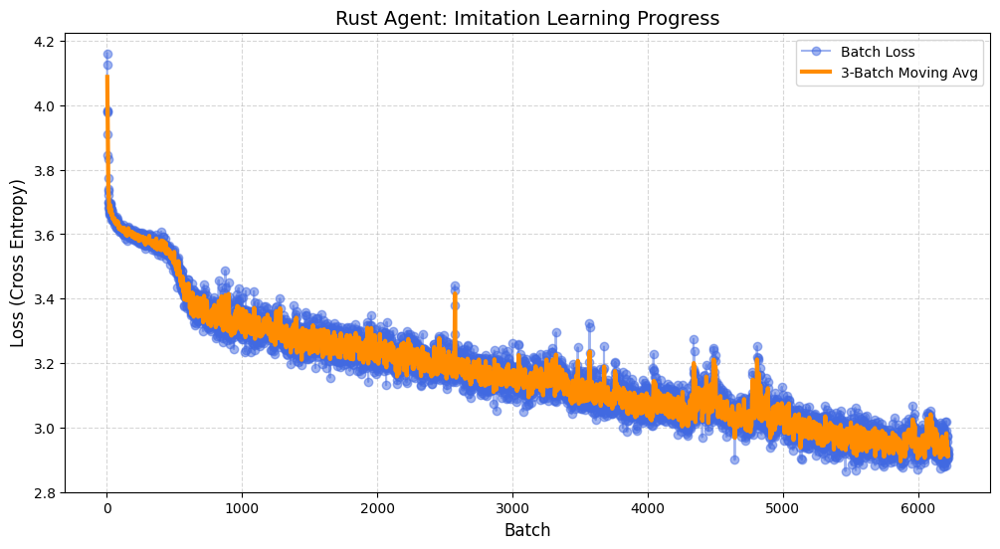

Epoch 51


Epoch 51: 100%|██████████| 122/122 [07:57<00:00,  3.91s/it, loss=2.97]


Epoch 51 | Avg Loss: 2.9402


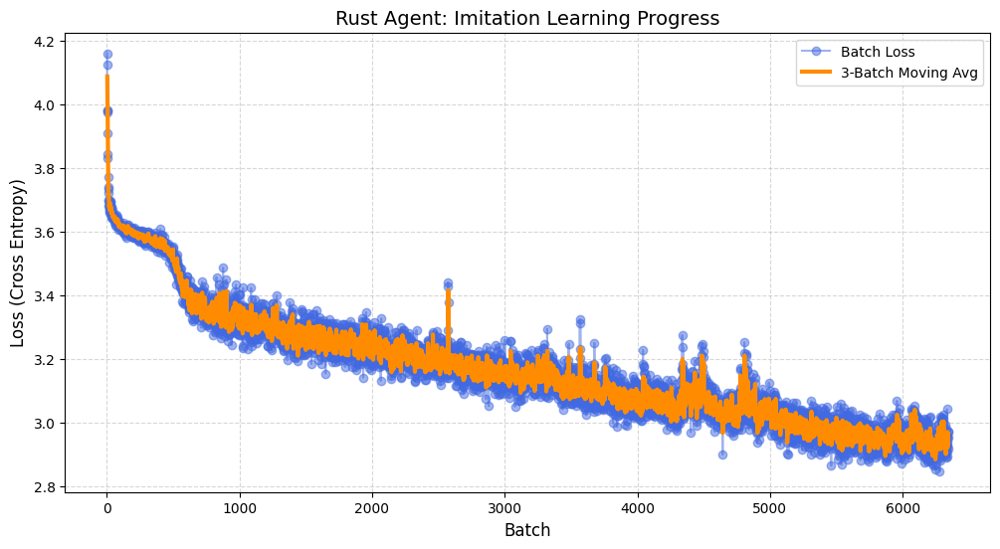

Epoch 52


Epoch 52: 100%|██████████| 122/122 [07:56<00:00,  3.91s/it, loss=2.92]


Epoch 52 | Avg Loss: 2.9134


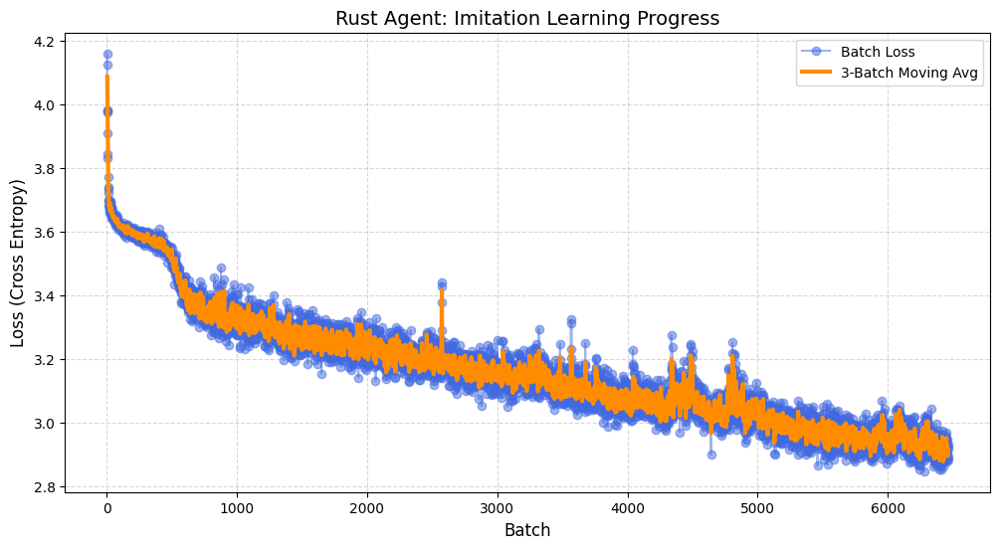

Epoch 53


Epoch 53: 100%|██████████| 122/122 [08:04<00:00,  3.97s/it, loss=2.97]


Epoch 53 | Avg Loss: 2.9263


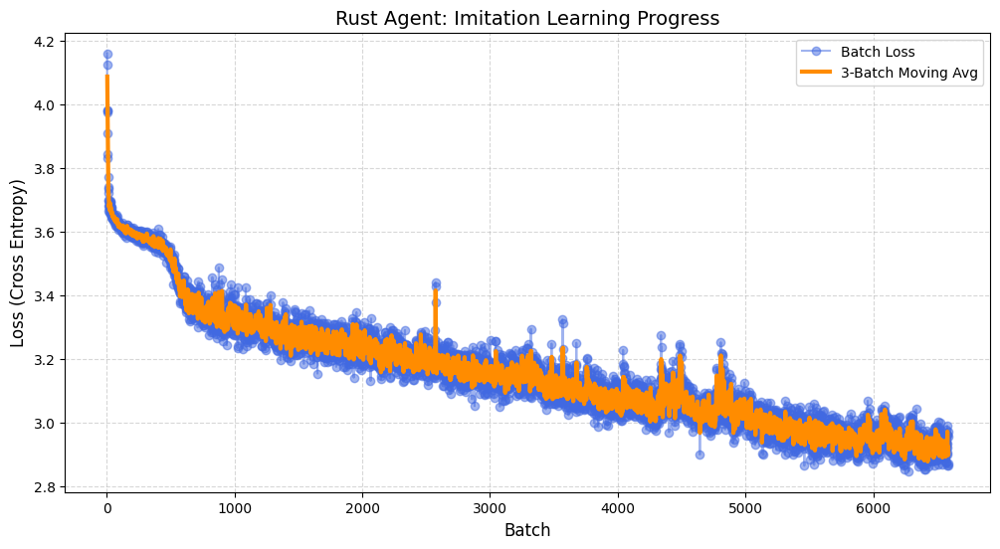

Epoch 54


Epoch 54: 100%|██████████| 122/122 [08:00<00:00,  3.93s/it, loss=2.88]


Epoch 54 | Avg Loss: 2.9085


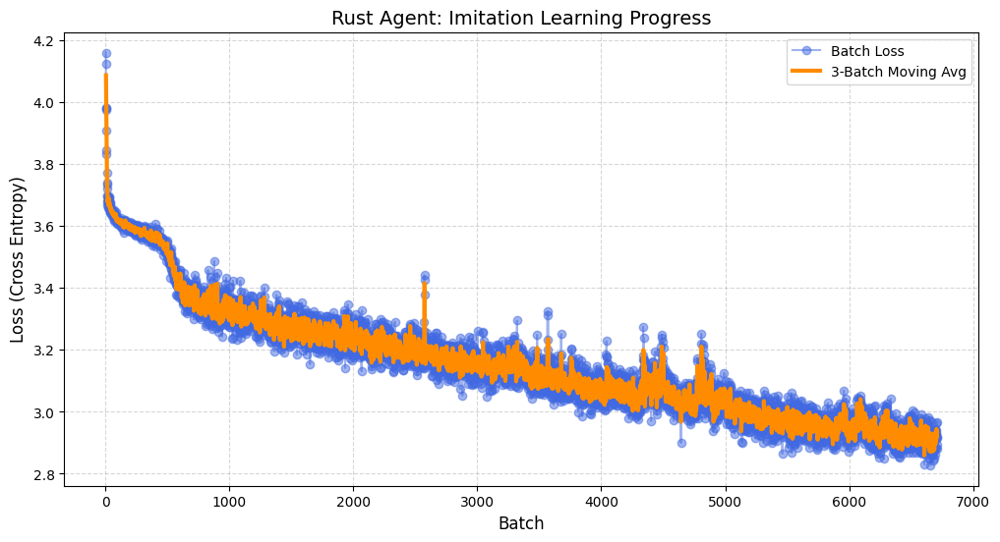

Epoch 55


Epoch 55: 100%|██████████| 122/122 [08:02<00:00,  3.95s/it, loss=2.86]


Epoch 55 | Avg Loss: 2.8965
Checkpoint saved to 1-13_imitation_models/checkpoint_55.pth


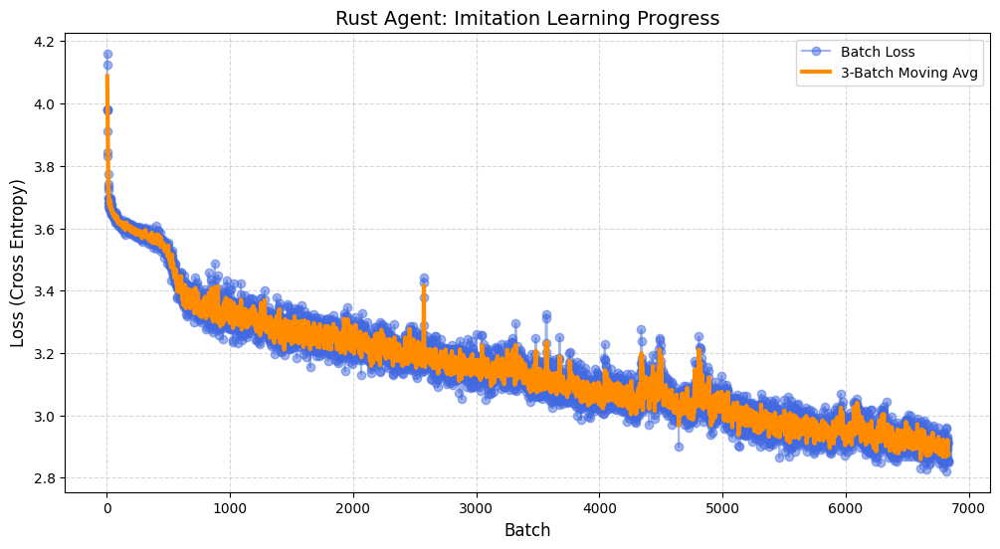

Epoch 56


Epoch 56: 100%|██████████| 122/122 [08:01<00:00,  3.94s/it, loss=2.93]


Epoch 56 | Avg Loss: 2.9110


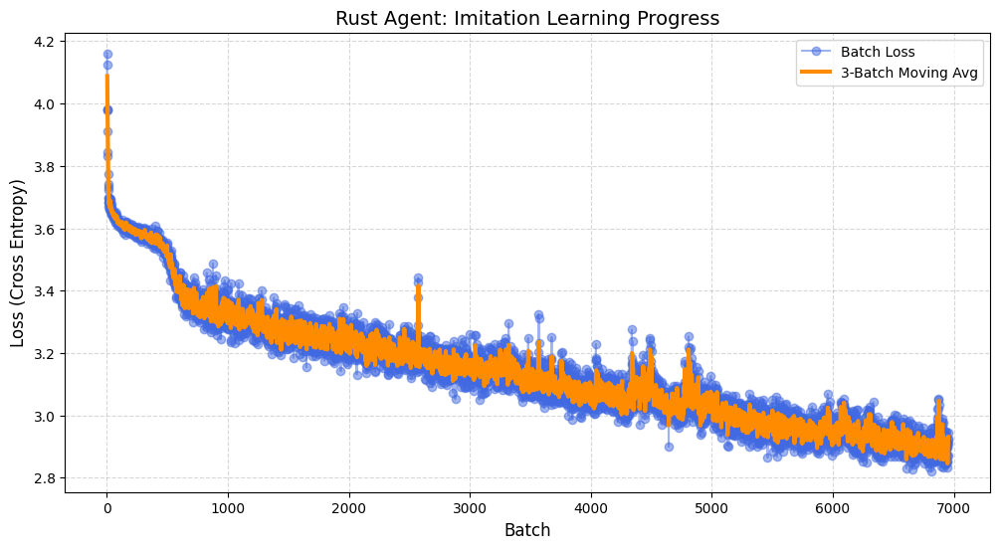

Epoch 57


Epoch 57: 100%|██████████| 122/122 [08:01<00:00,  3.94s/it, loss=2.88]


Epoch 57 | Avg Loss: 2.8885


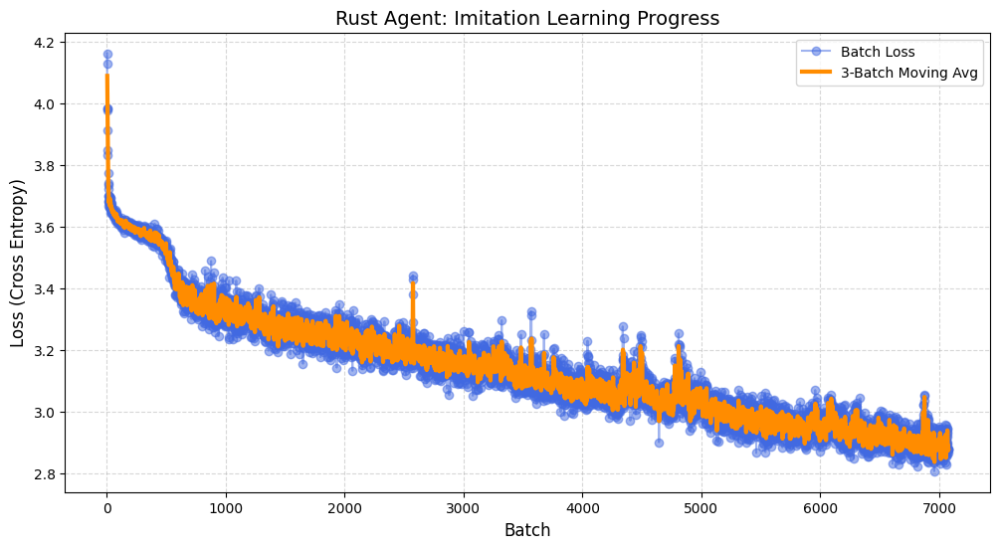

Epoch 58


Epoch 58: 100%|██████████| 122/122 [07:59<00:00,  3.93s/it, loss=2.87]


Epoch 58 | Avg Loss: 2.8787


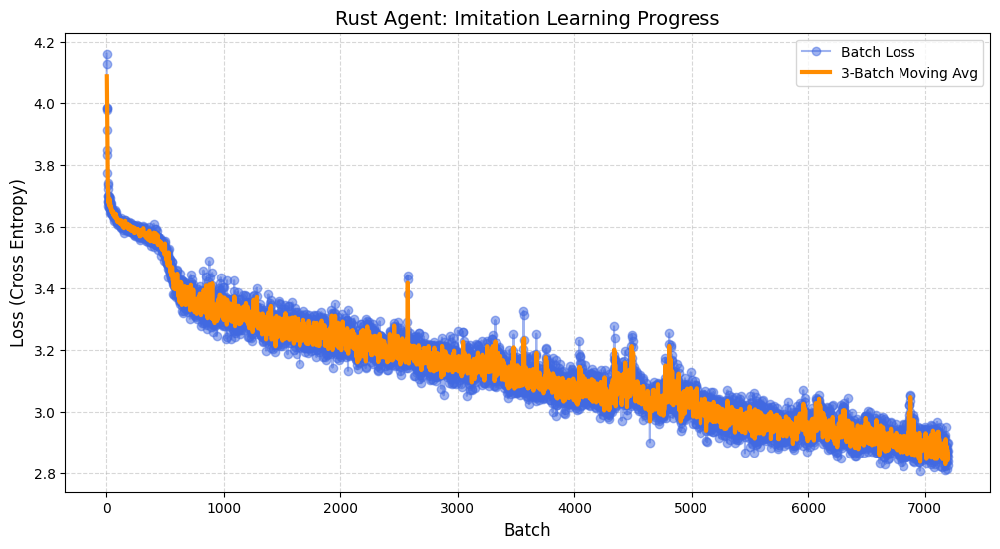

Epoch 59


Epoch 59: 100%|██████████| 122/122 [08:01<00:00,  3.95s/it, loss=2.92]


Epoch 59 | Avg Loss: 2.8713


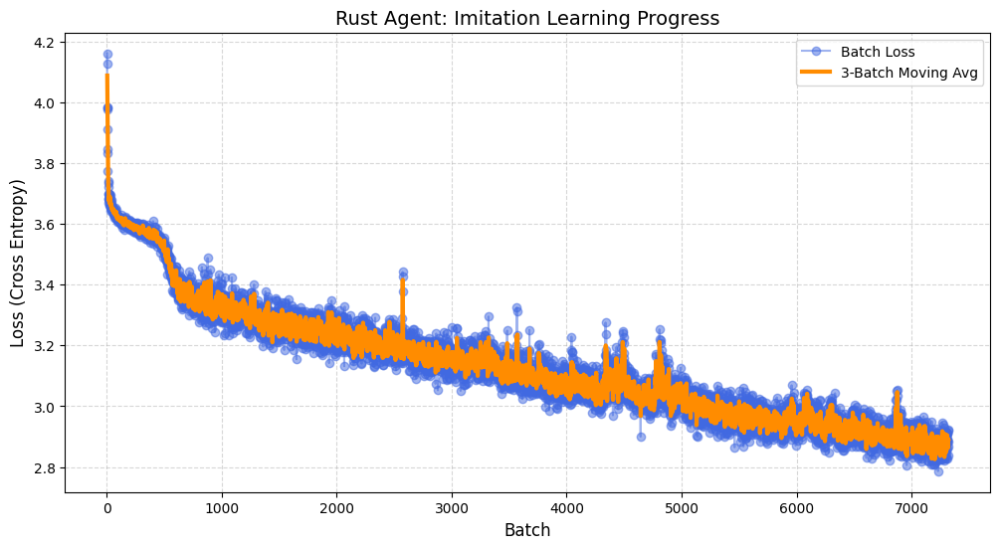

Epoch 60


Epoch 60: 100%|██████████| 122/122 [07:59<00:00,  3.93s/it, loss=2.88]


Epoch 60 | Avg Loss: 2.8605
Checkpoint saved to 1-13_imitation_models/checkpoint_60.pth


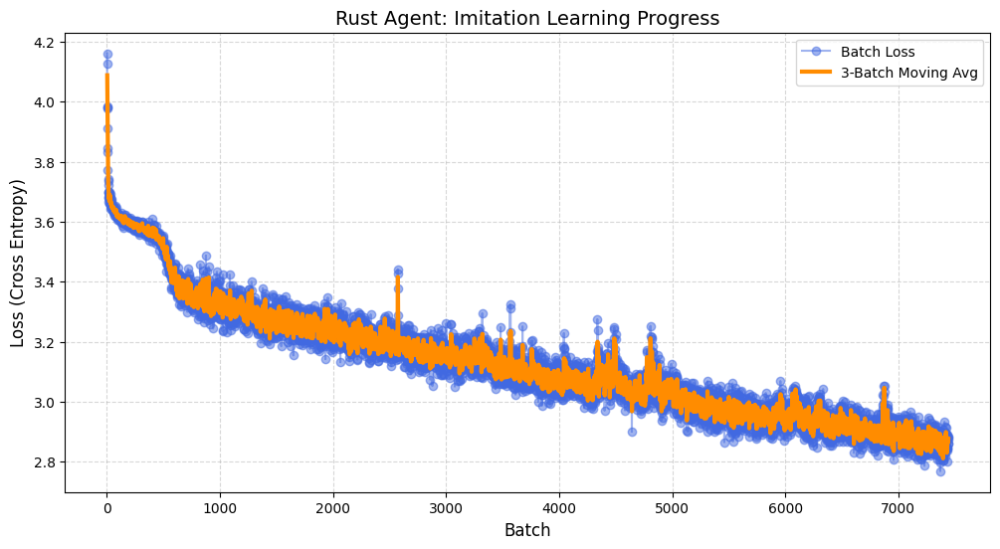

Epoch 61


Epoch 61: 100%|██████████| 122/122 [07:59<00:00,  3.93s/it, loss=2.86]


Epoch 61 | Avg Loss: 2.8485


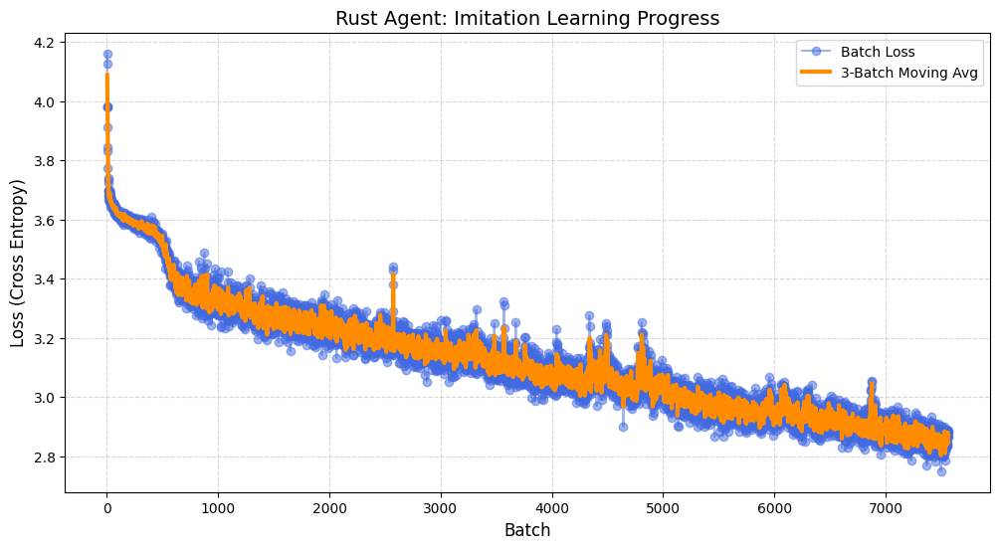

Epoch 62


Epoch 62: 100%|██████████| 122/122 [07:57<00:00,  3.91s/it, loss=2.9]


Epoch 62 | Avg Loss: 2.8530


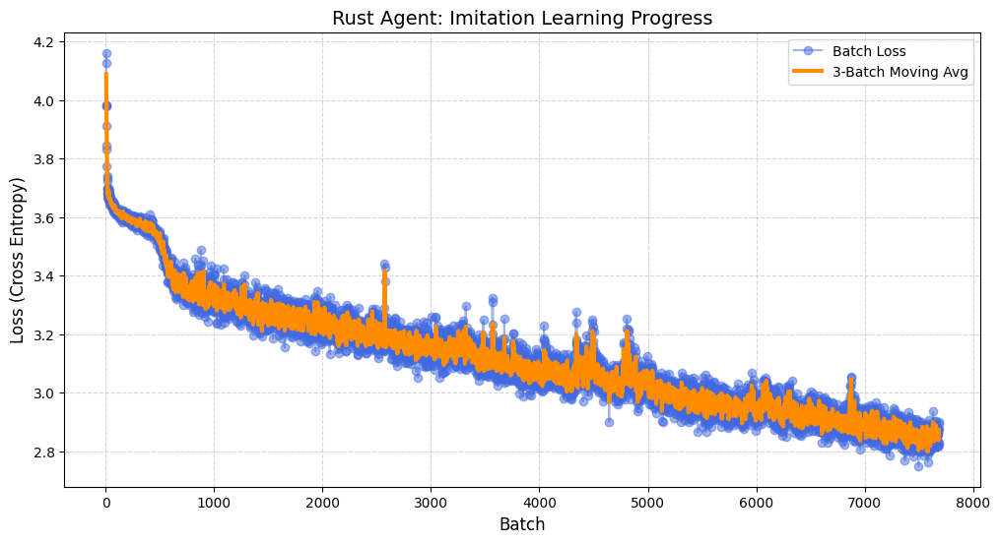

Epoch 63


Epoch 63: 100%|██████████| 122/122 [07:58<00:00,  3.92s/it, loss=2.82]


Epoch 63 | Avg Loss: 2.8473


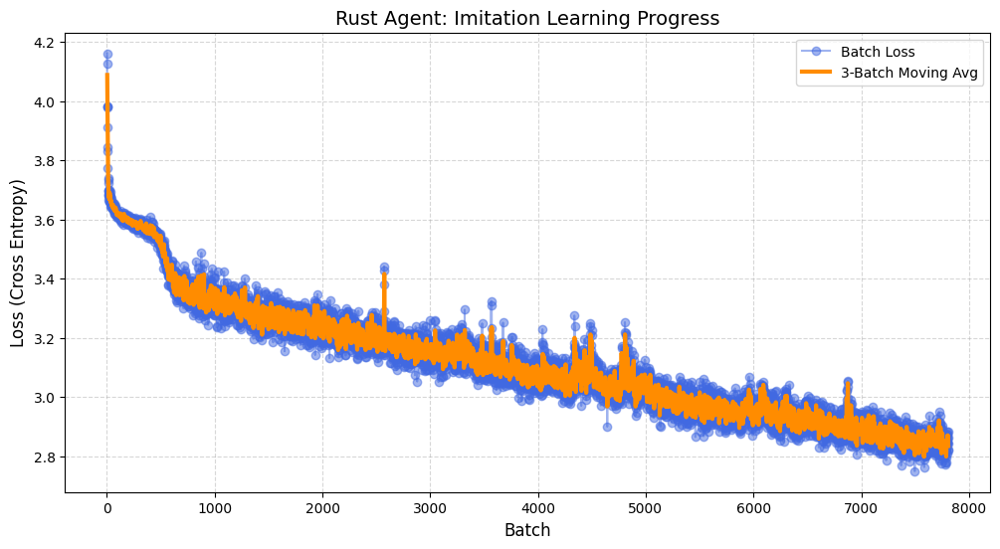

Epoch 64


Epoch 64: 100%|██████████| 122/122 [07:56<00:00,  3.90s/it, loss=2.88]


Epoch 64 | Avg Loss: 2.8351


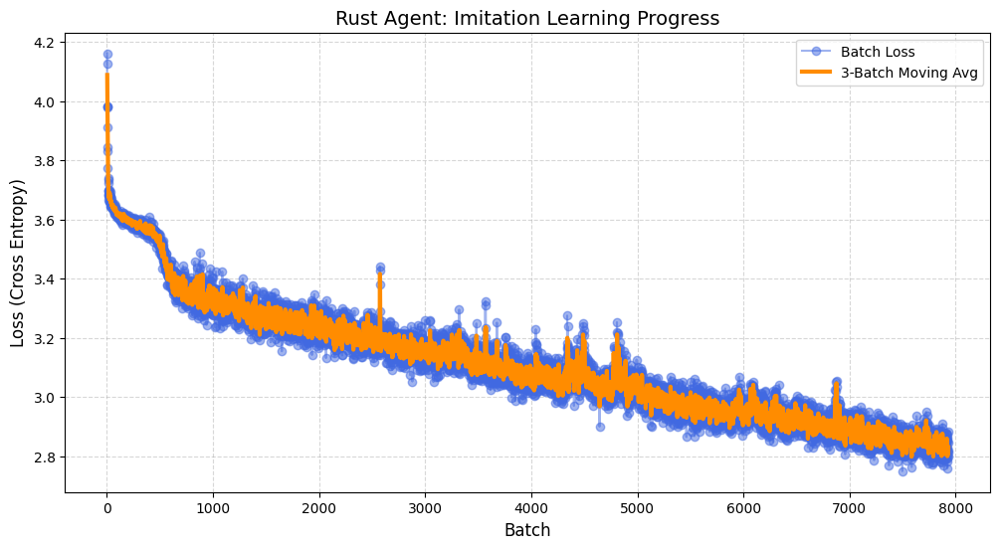

Epoch 65


Epoch 65: 100%|██████████| 122/122 [07:54<00:00,  3.89s/it, loss=2.77]


Epoch 65 | Avg Loss: 2.8294
Checkpoint saved to 1-13_imitation_models/checkpoint_65.pth


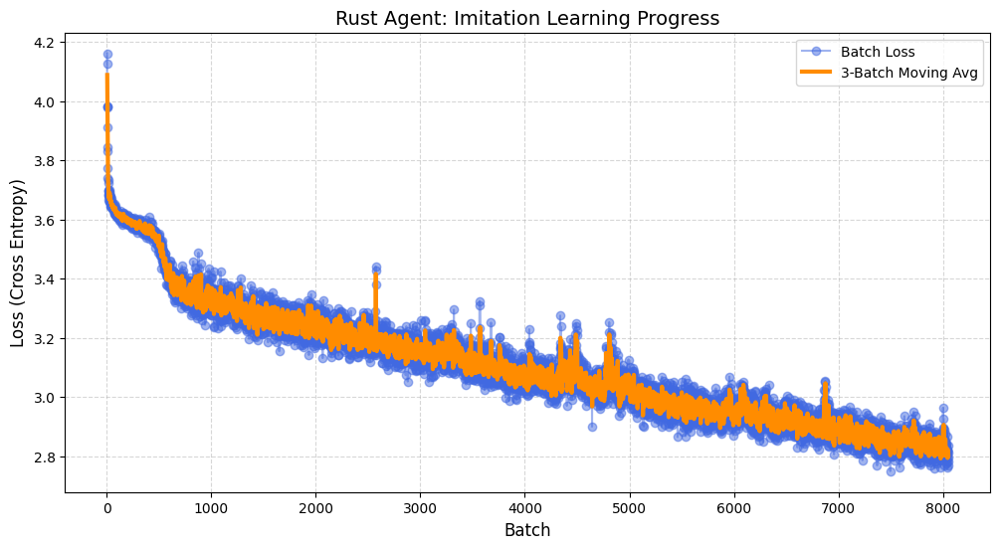

Epoch 66


Epoch 66: 100%|██████████| 122/122 [07:53<00:00,  3.88s/it, loss=2.77]


Epoch 66 | Avg Loss: 2.8245


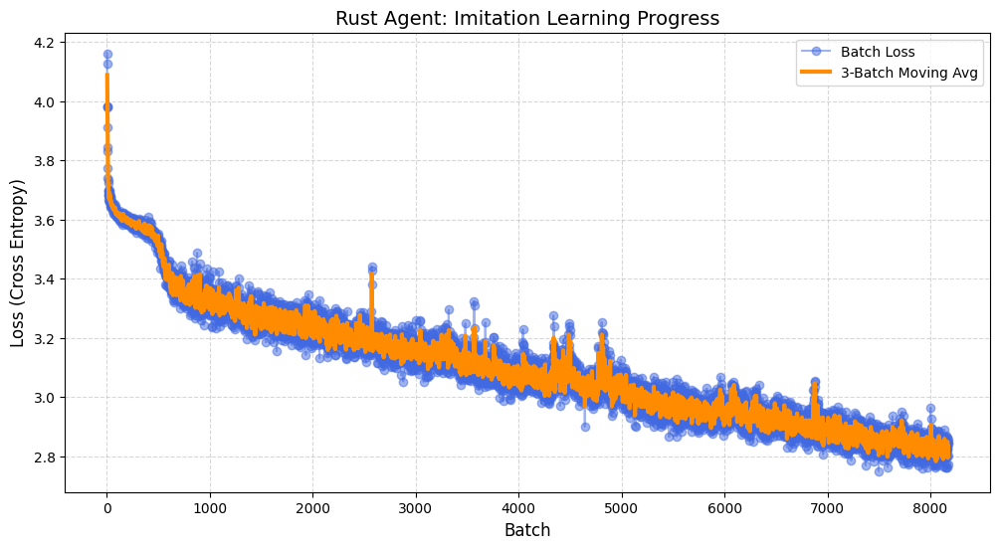

Epoch 67


Epoch 67: 100%|██████████| 122/122 [07:54<00:00,  3.89s/it, loss=2.85]


Epoch 67 | Avg Loss: 2.8091


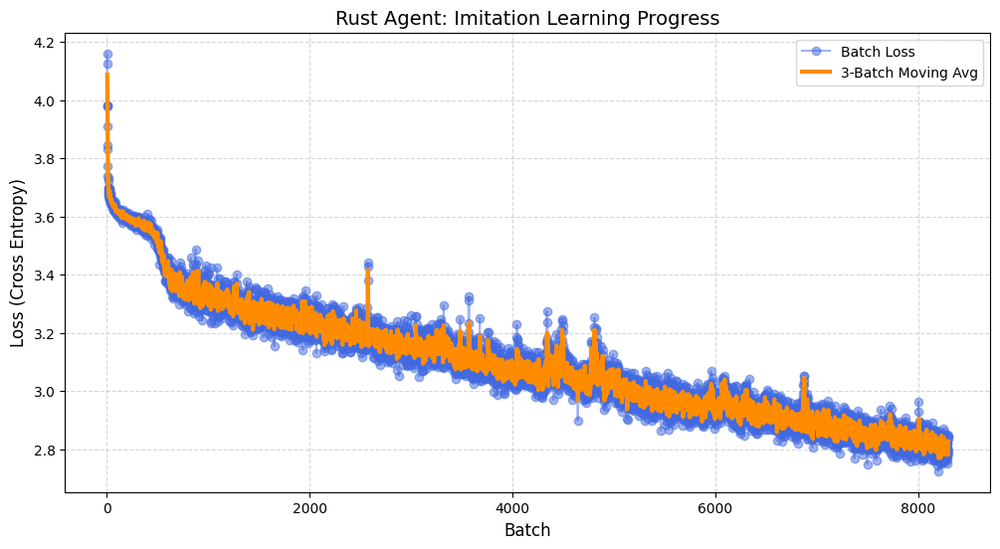

Epoch 68


Epoch 68: 100%|██████████| 122/122 [07:56<00:00,  3.90s/it, loss=2.82]


Epoch 68 | Avg Loss: 2.8055


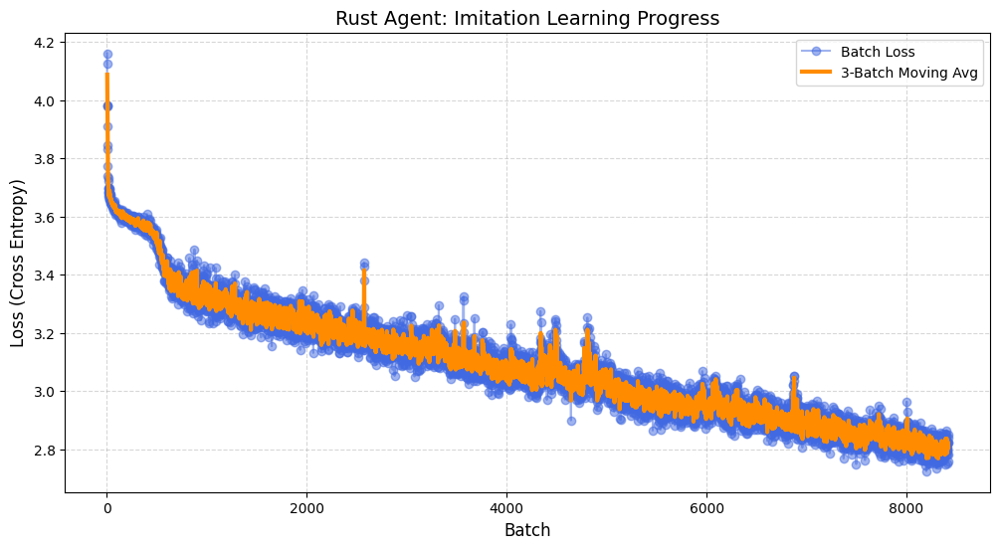

Epoch 69


Epoch 69: 100%|██████████| 122/122 [07:56<00:00,  3.90s/it, loss=2.83]


Epoch 69 | Avg Loss: 2.8011


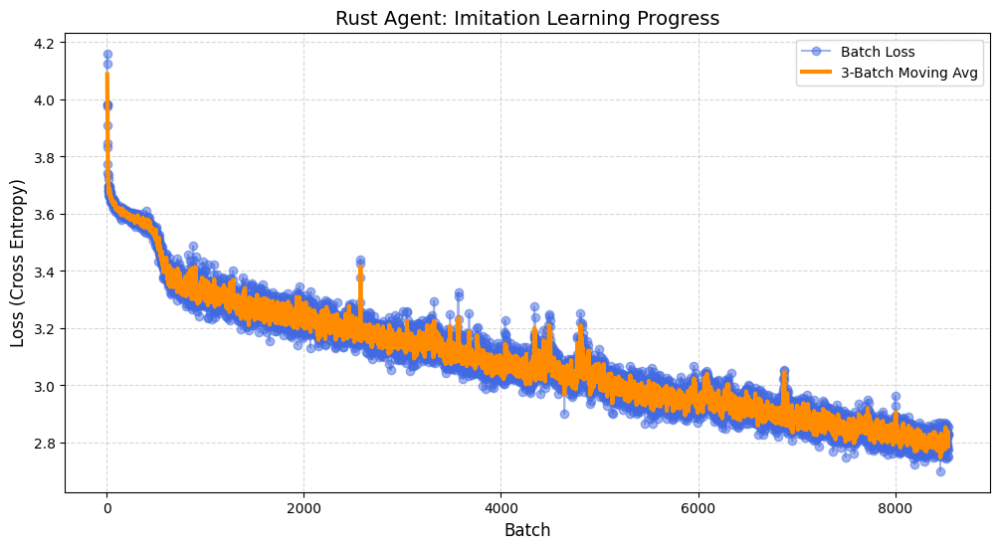

Epoch 70


Epoch 70: 100%|██████████| 122/122 [07:56<00:00,  3.90s/it, loss=2.78]


Epoch 70 | Avg Loss: 2.7920
Checkpoint saved to 1-13_imitation_models/checkpoint_70.pth


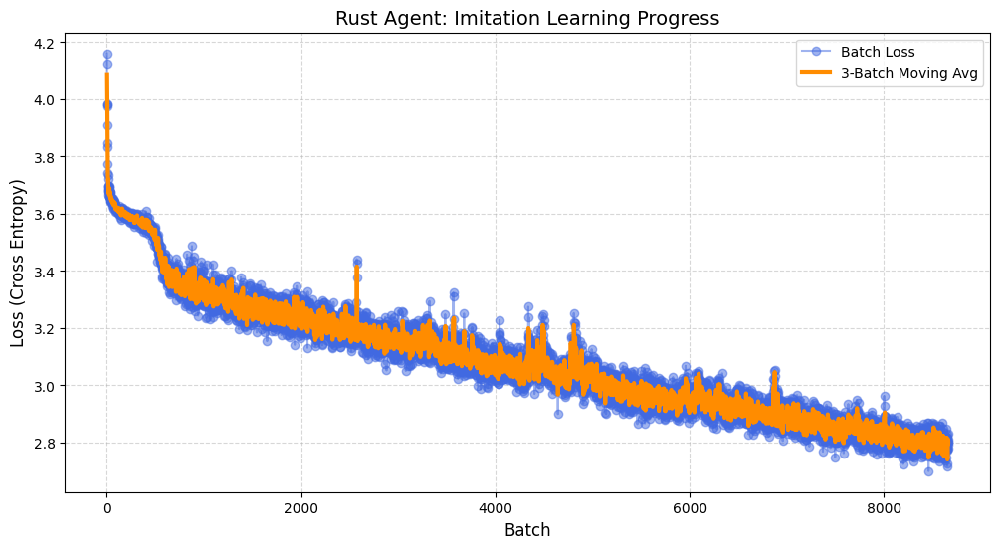

Epoch 71


Epoch 71: 100%|██████████| 122/122 [07:54<00:00,  3.89s/it, loss=2.77]


Epoch 71 | Avg Loss: 2.7861


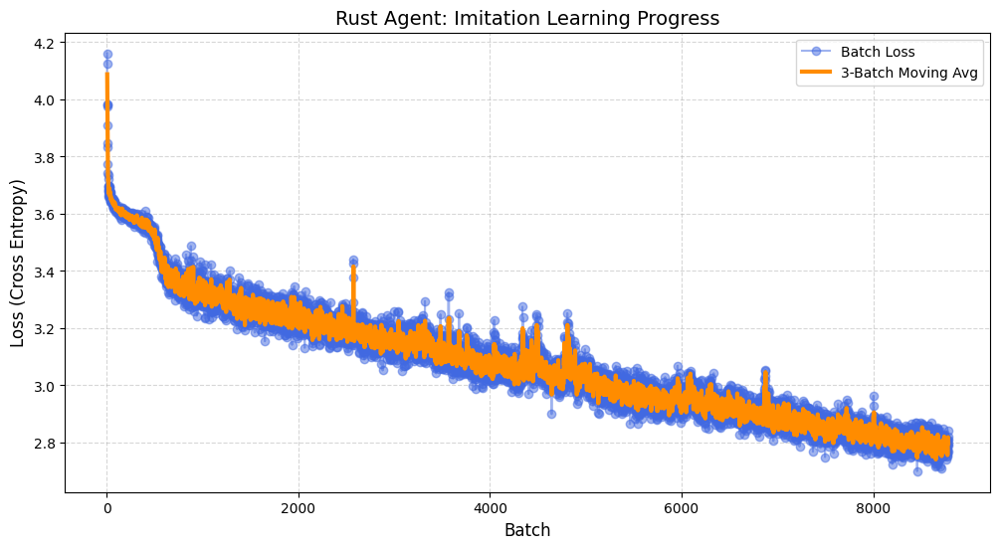

Epoch 72


Epoch 72: 100%|██████████| 122/122 [07:53<00:00,  3.88s/it, loss=2.77]


Epoch 72 | Avg Loss: 2.7812


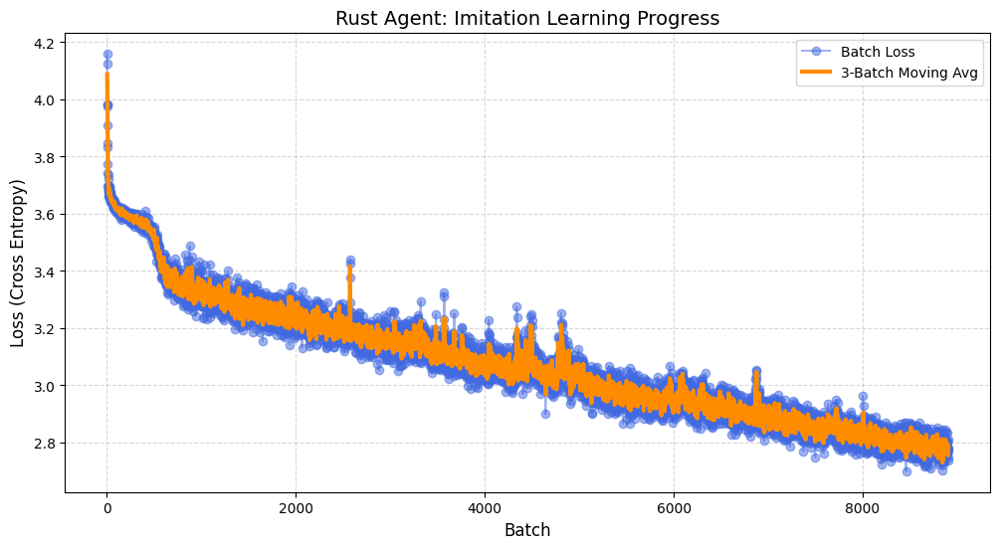

Epoch 73


Epoch 73: 100%|██████████| 122/122 [07:51<00:00,  3.86s/it, loss=2.79]


Epoch 73 | Avg Loss: 2.7751


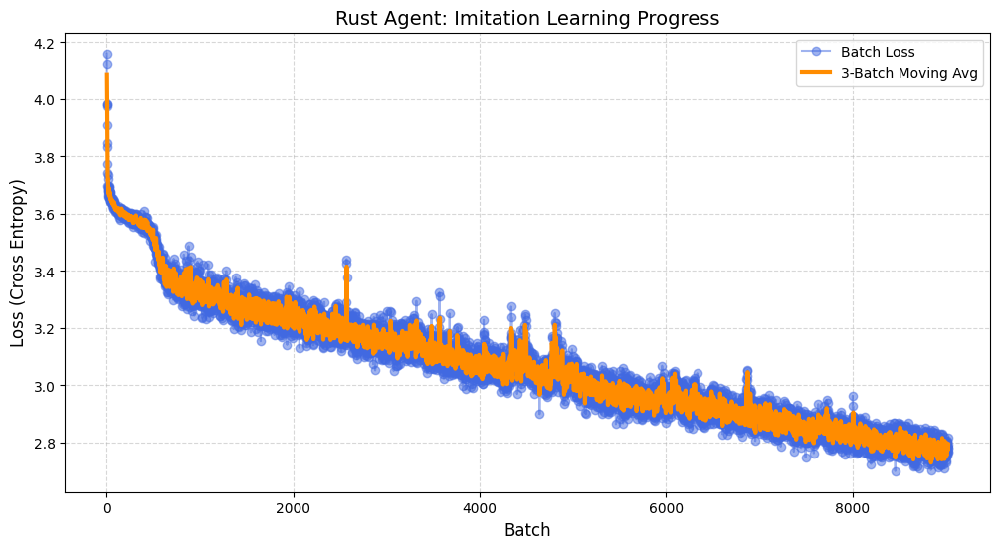

Epoch 74


Epoch 74: 100%|██████████| 122/122 [07:53<00:00,  3.88s/it, loss=2.74]


Epoch 74 | Avg Loss: 2.7712


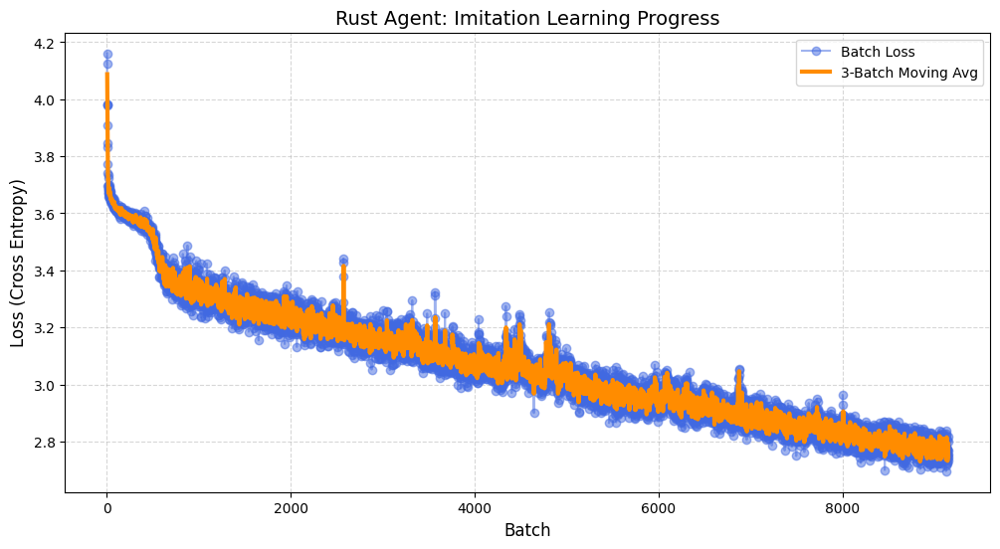

Epoch 75


Epoch 75: 100%|██████████| 122/122 [07:51<00:00,  3.87s/it, loss=2.77]


Epoch 75 | Avg Loss: 2.7680
Checkpoint saved to 1-13_imitation_models/checkpoint_75.pth


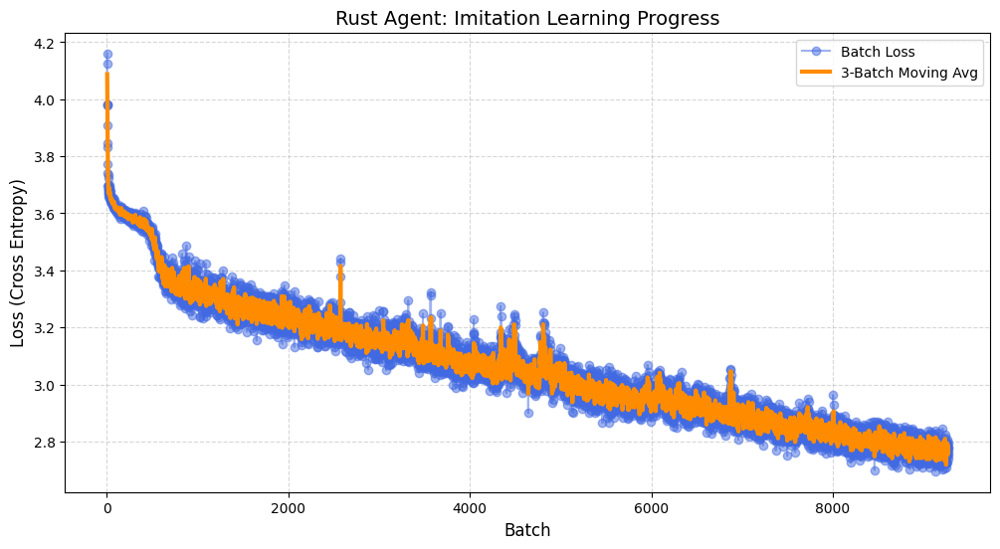

Epoch 76


Epoch 76: 100%|██████████| 122/122 [07:55<00:00,  3.90s/it, loss=2.77]


Epoch 76 | Avg Loss: 2.7627


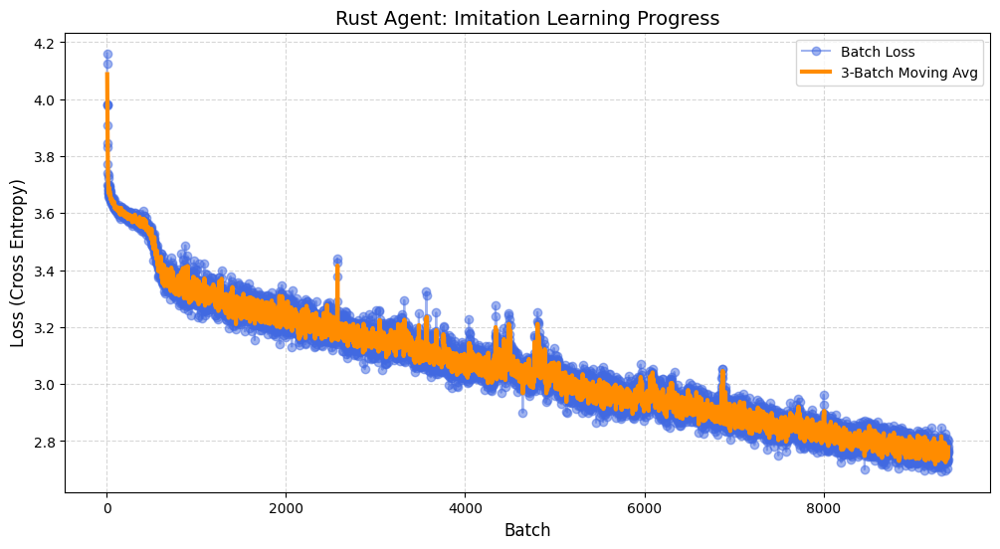

Epoch 77


Epoch 77: 100%|██████████| 122/122 [07:54<00:00,  3.89s/it, loss=2.75]


Epoch 77 | Avg Loss: 2.7591


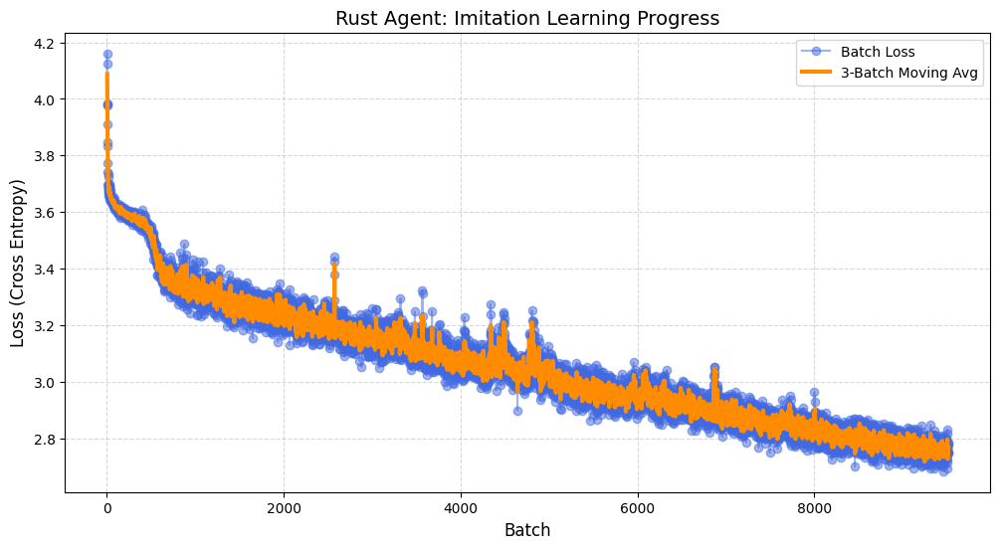

Epoch 78


Epoch 78: 100%|██████████| 122/122 [07:54<00:00,  3.89s/it, loss=2.74]


Epoch 78 | Avg Loss: 2.7528


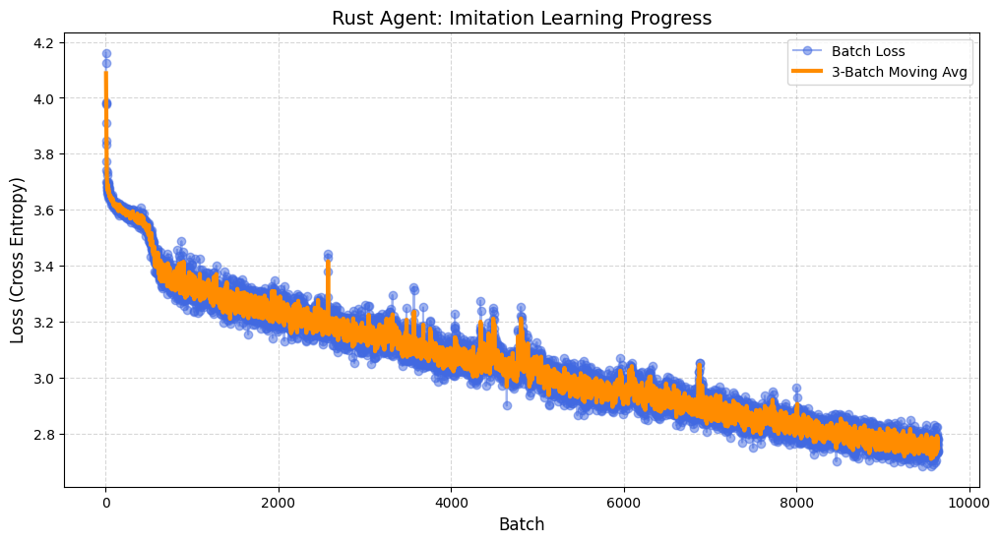

Epoch 79


Epoch 79: 100%|██████████| 122/122 [07:54<00:00,  3.89s/it, loss=2.79]


Epoch 79 | Avg Loss: 2.7511


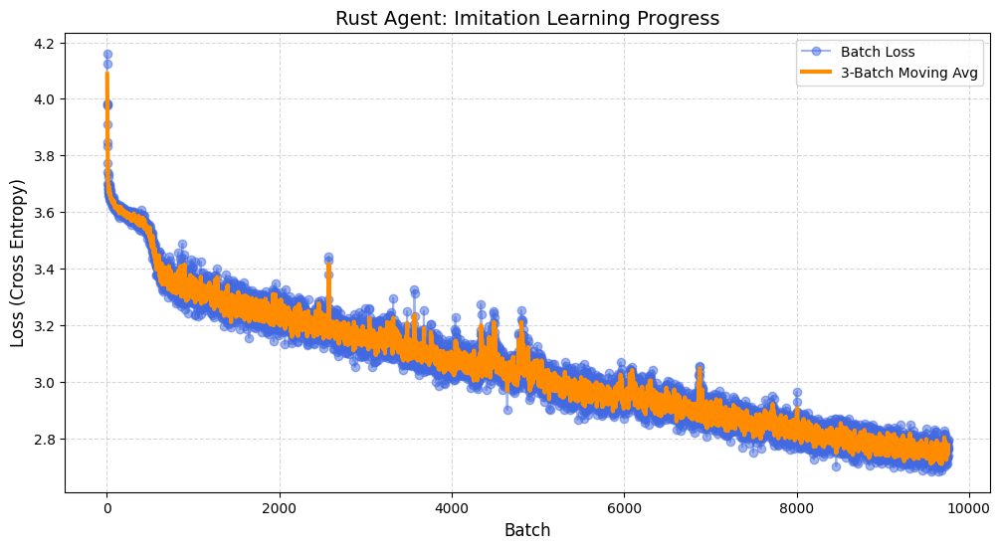

Epoch 80


Epoch 80: 100%|██████████| 122/122 [07:53<00:00,  3.88s/it, loss=2.73]


Epoch 80 | Avg Loss: 2.7491
Checkpoint saved to 1-13_imitation_models/checkpoint_80.pth


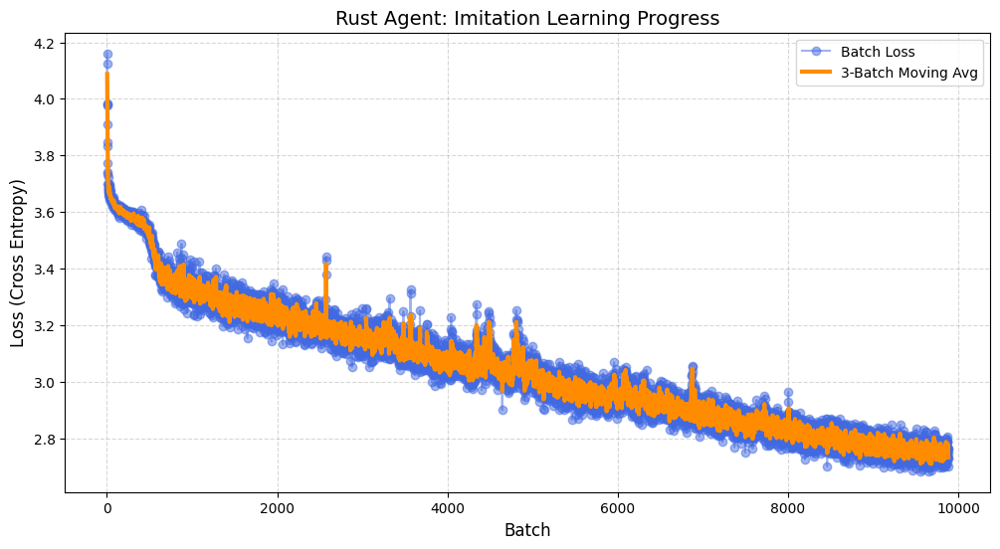

Epoch 81


Epoch 81: 100%|██████████| 122/122 [07:57<00:00,  3.91s/it, loss=2.75]


Epoch 81 | Avg Loss: 2.7444


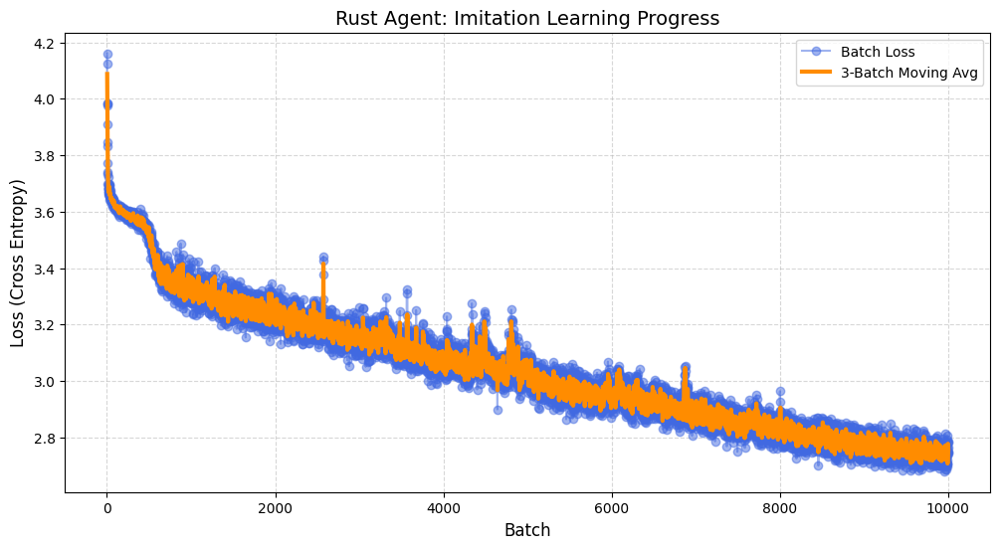

Epoch 82


Epoch 82: 100%|██████████| 122/122 [07:57<00:00,  3.91s/it, loss=2.74]


Epoch 82 | Avg Loss: 2.7418


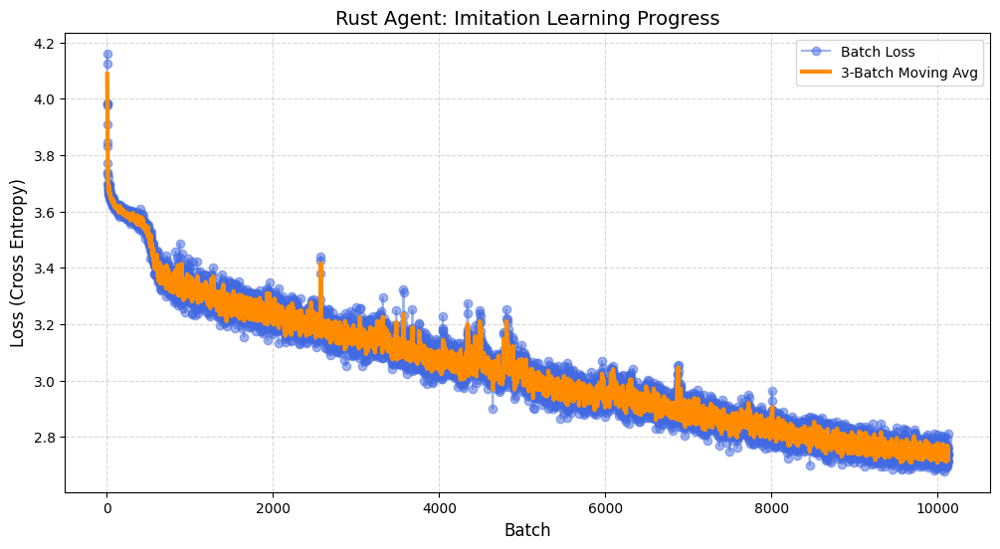

Epoch 83


Epoch 83: 100%|██████████| 122/122 [07:57<00:00,  3.91s/it, loss=2.73]


Epoch 83 | Avg Loss: 2.7388


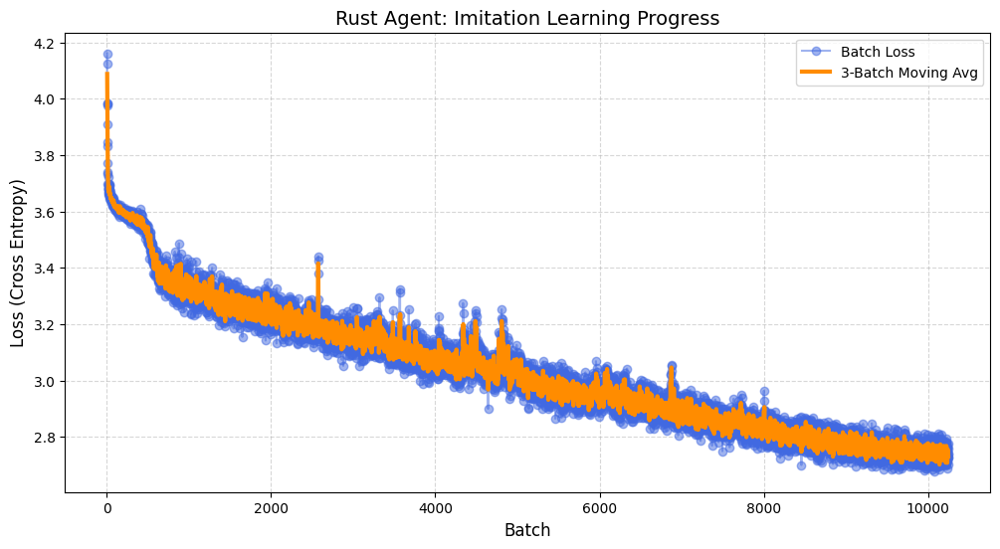

Epoch 84


Epoch 84: 100%|██████████| 122/122 [07:56<00:00,  3.90s/it, loss=2.72]


Epoch 84 | Avg Loss: 2.7377


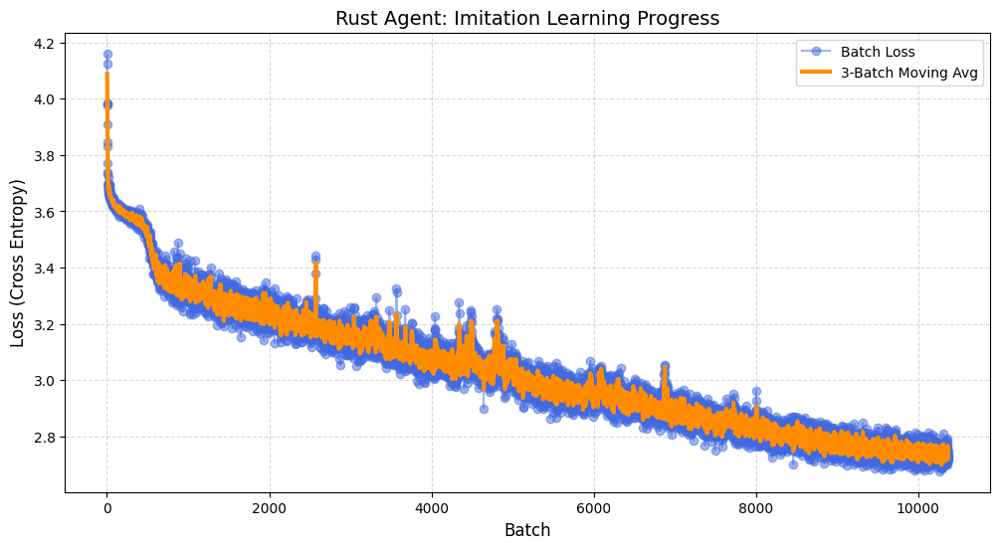

Epoch 85


Epoch 85: 100%|██████████| 122/122 [07:56<00:00,  3.90s/it, loss=2.74]


Epoch 85 | Avg Loss: 2.7346
Checkpoint saved to 1-13_imitation_models/checkpoint_85.pth


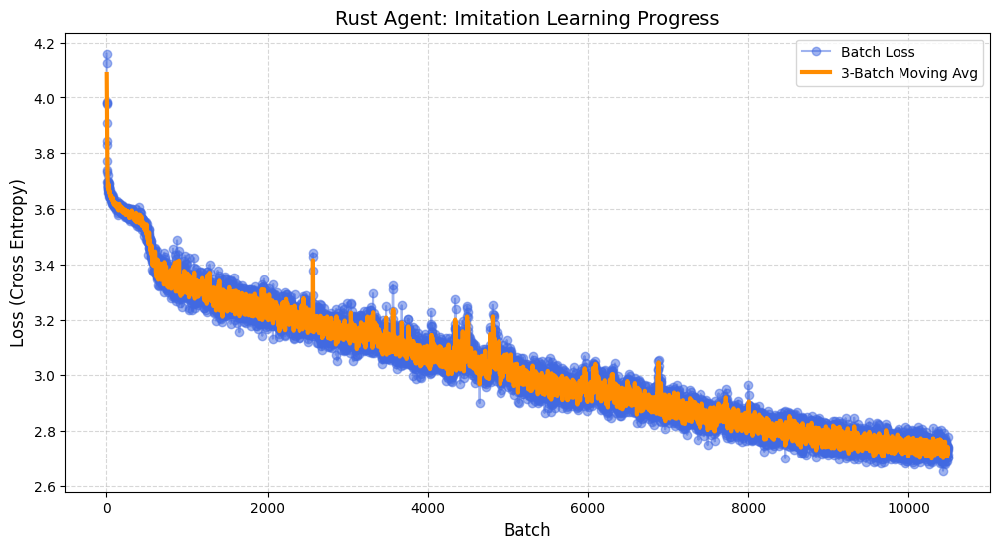

Epoch 86


Epoch 86: 100%|██████████| 122/122 [07:55<00:00,  3.90s/it, loss=2.75]


Epoch 86 | Avg Loss: 2.7327


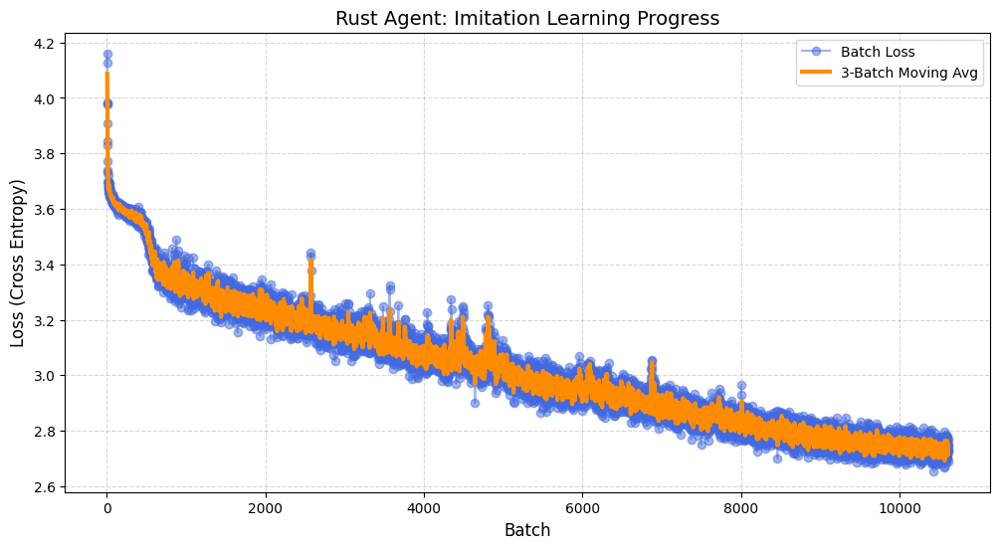

Epoch 87


Epoch 87: 100%|██████████| 122/122 [07:55<00:00,  3.89s/it, loss=2.71]


Epoch 87 | Avg Loss: 2.7304


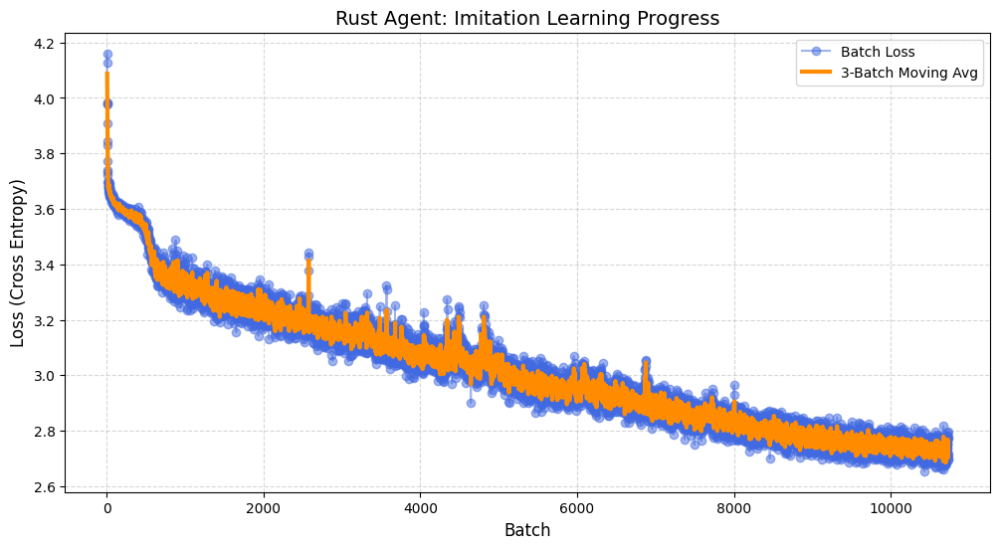

Epoch 88


Epoch 88: 100%|██████████| 122/122 [07:55<00:00,  3.90s/it, loss=2.71]


Epoch 88 | Avg Loss: 2.7287


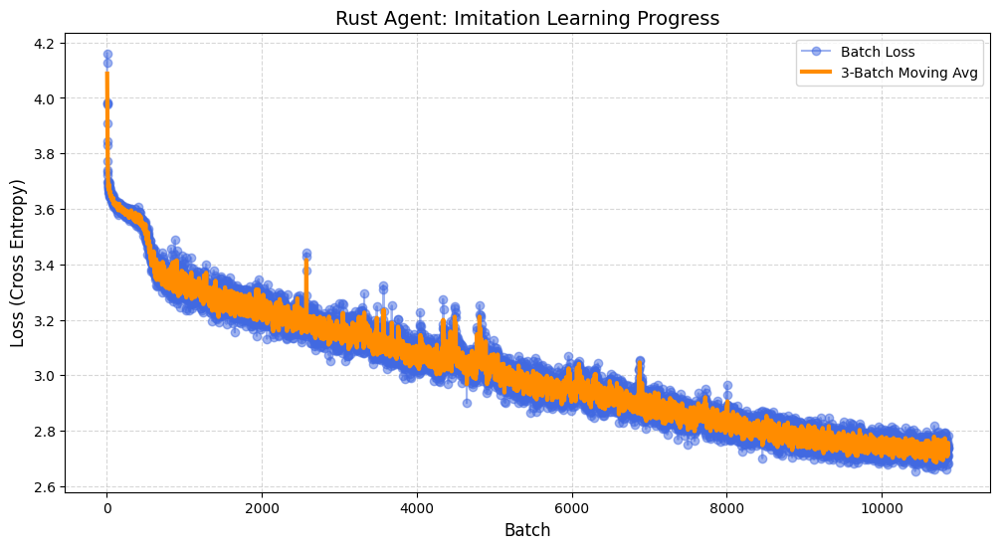

Epoch 89


Epoch 89: 100%|██████████| 122/122 [07:55<00:00,  3.90s/it, loss=2.77]


Epoch 89 | Avg Loss: 2.7274


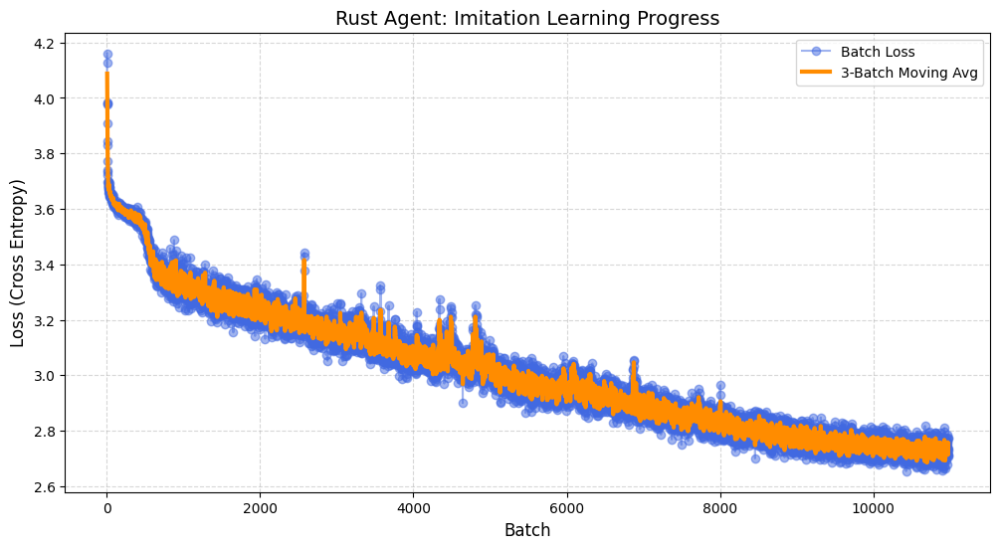

Epoch 90


Epoch 90: 100%|██████████| 122/122 [07:57<00:00,  3.91s/it, loss=2.75]


Epoch 90 | Avg Loss: 2.7254
Checkpoint saved to 1-13_imitation_models/checkpoint_90.pth


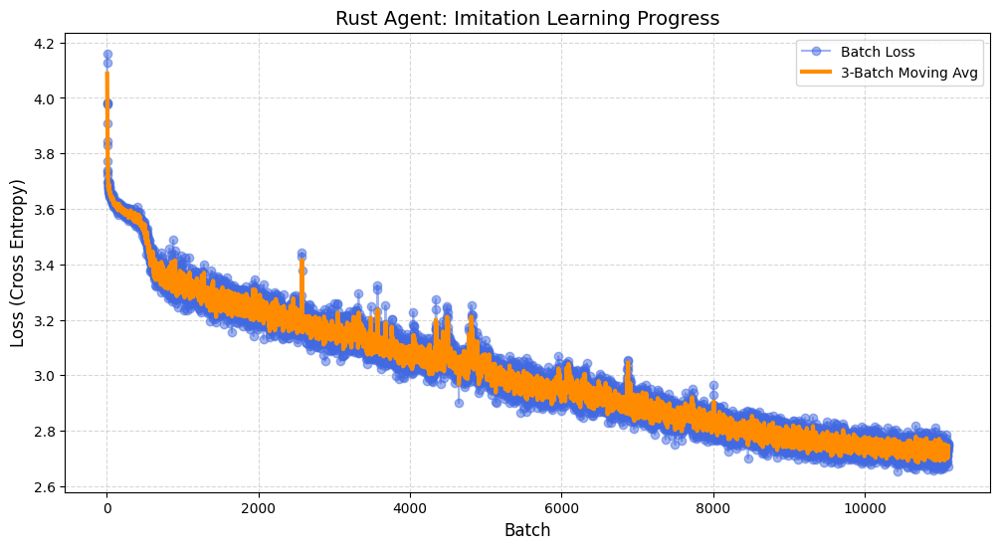

Epoch 91


Epoch 91: 100%|██████████| 122/122 [07:56<00:00,  3.91s/it, loss=2.7]


Epoch 91 | Avg Loss: 2.7242


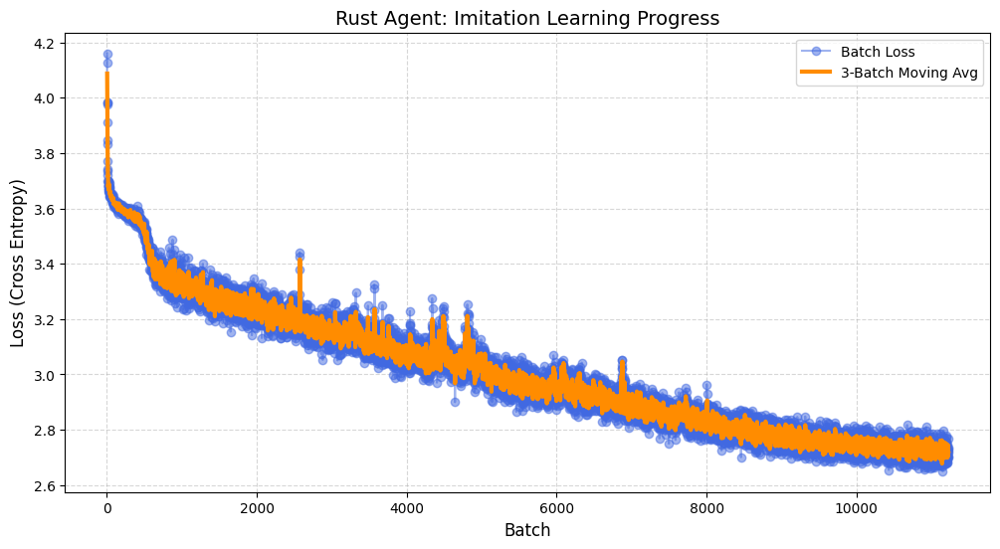

Epoch 92


Epoch 92: 100%|██████████| 122/122 [07:56<00:00,  3.91s/it, loss=2.69]


Epoch 92 | Avg Loss: 2.7230


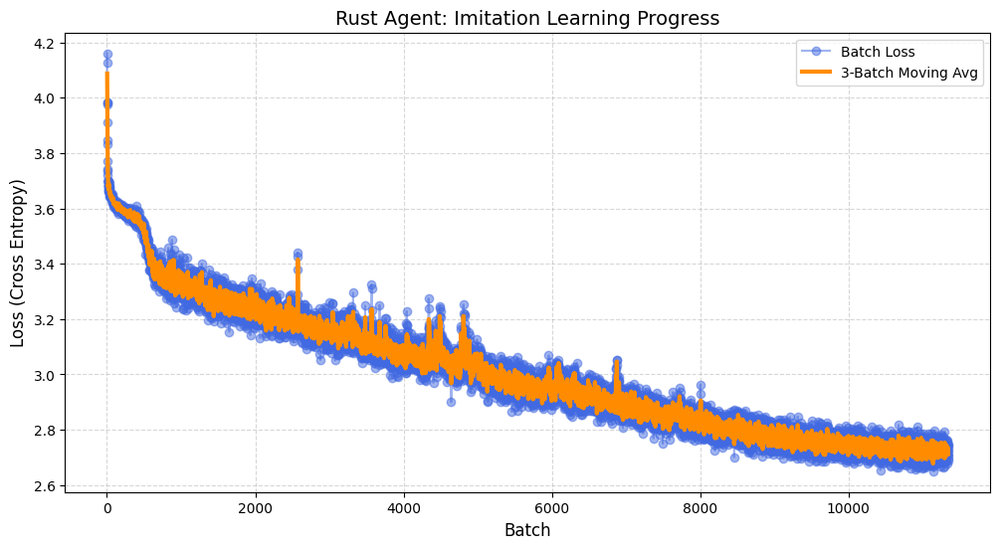

Epoch 93


Epoch 93: 100%|██████████| 122/122 [07:56<00:00,  3.90s/it, loss=2.75]


Epoch 93 | Avg Loss: 2.7231


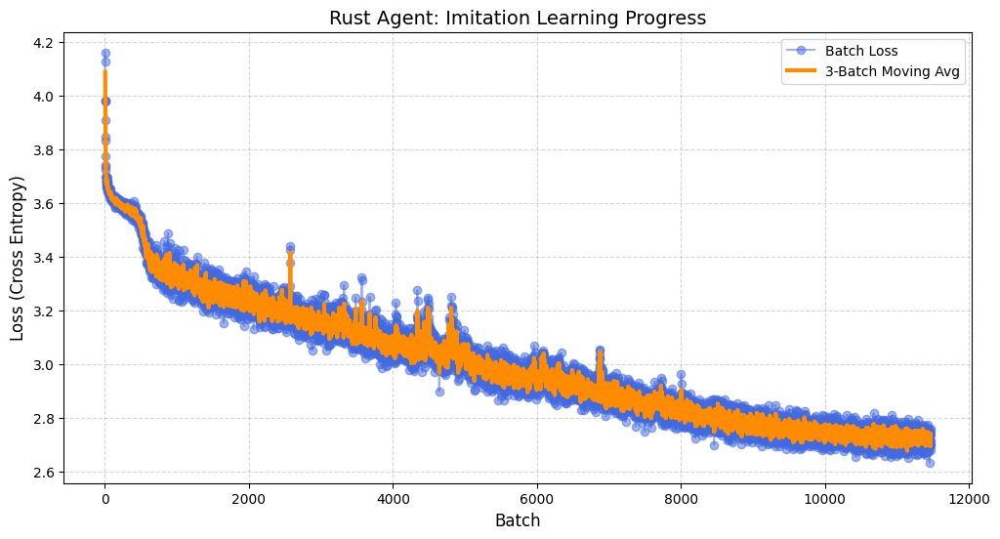

Epoch 94


Epoch 94: 100%|██████████| 122/122 [07:57<00:00,  3.91s/it, loss=2.71]


Epoch 94 | Avg Loss: 2.7232


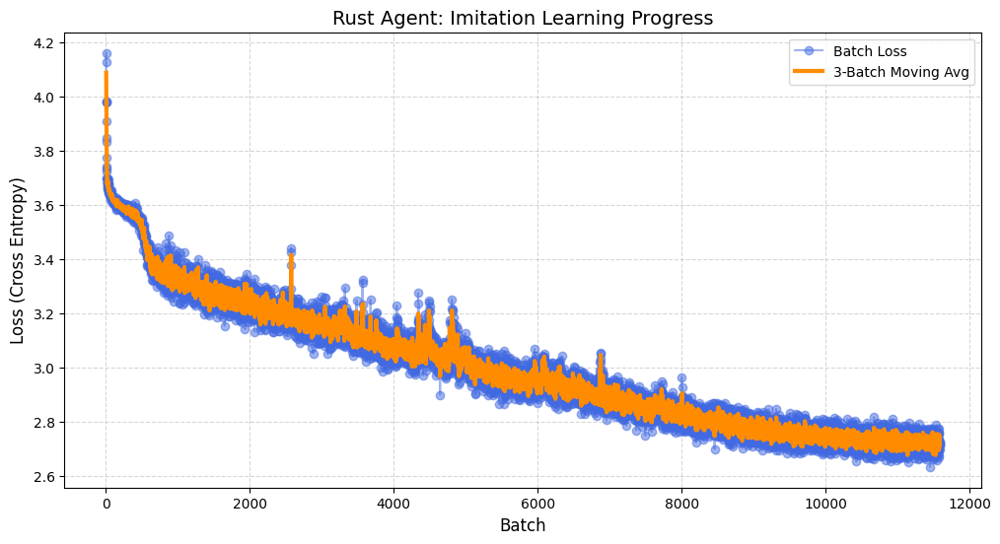

Epoch 95


Epoch 95: 100%|██████████| 122/122 [07:57<00:00,  3.91s/it, loss=2.76]


Epoch 95 | Avg Loss: 2.7227
Checkpoint saved to 1-13_imitation_models/checkpoint_95.pth


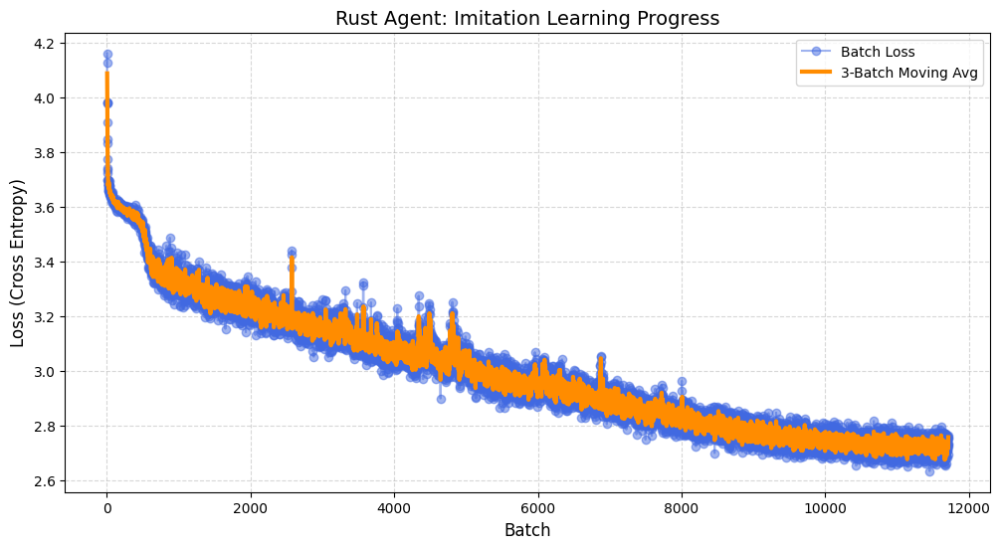

Epoch 96


Epoch 96: 100%|██████████| 122/122 [07:57<00:00,  3.92s/it, loss=2.73]


Epoch 96 | Avg Loss: 2.7213


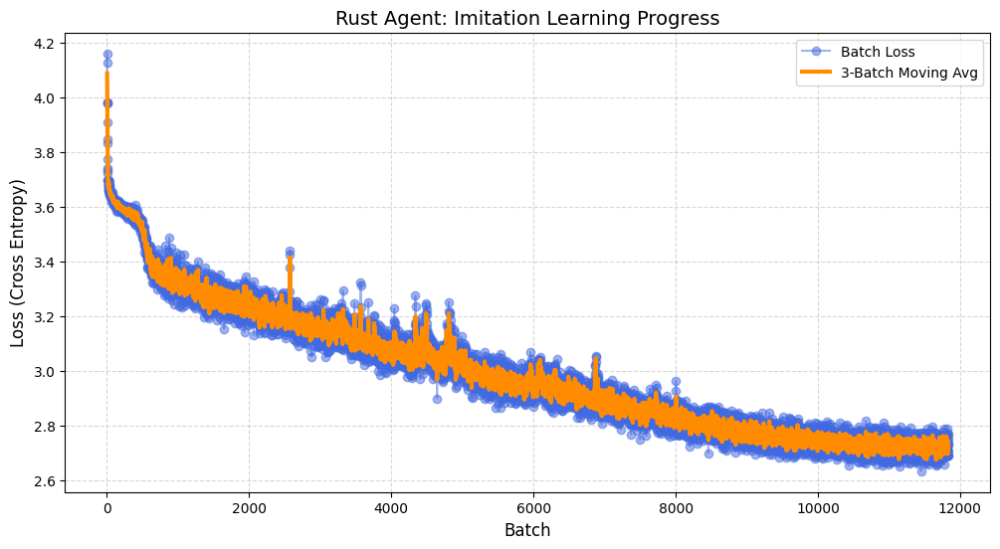

Epoch 97


Epoch 97: 100%|██████████| 122/122 [07:57<00:00,  3.91s/it, loss=2.75]


Epoch 97 | Avg Loss: 2.7221


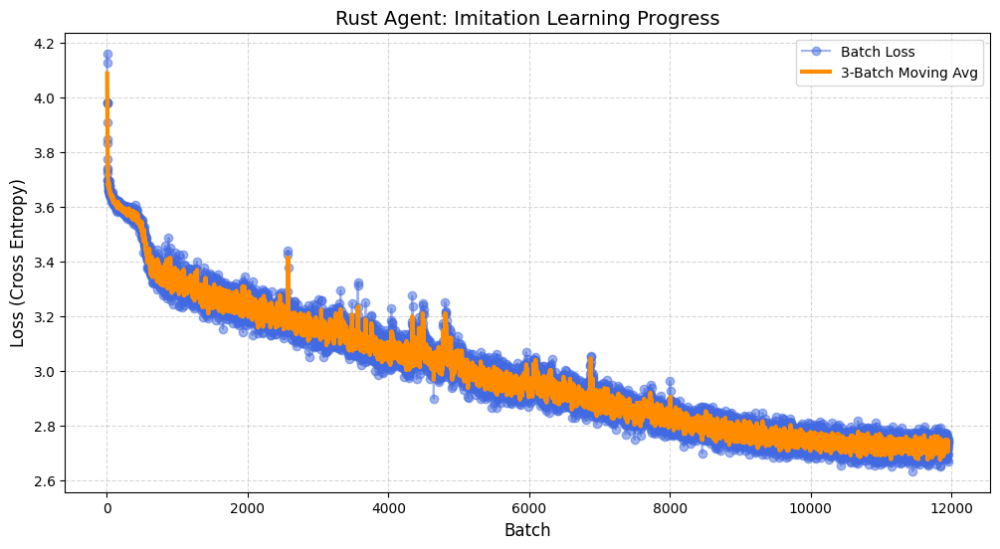

Epoch 98


Epoch 98: 100%|██████████| 122/122 [07:56<00:00,  3.90s/it, loss=2.7]


Epoch 98 | Avg Loss: 2.7218


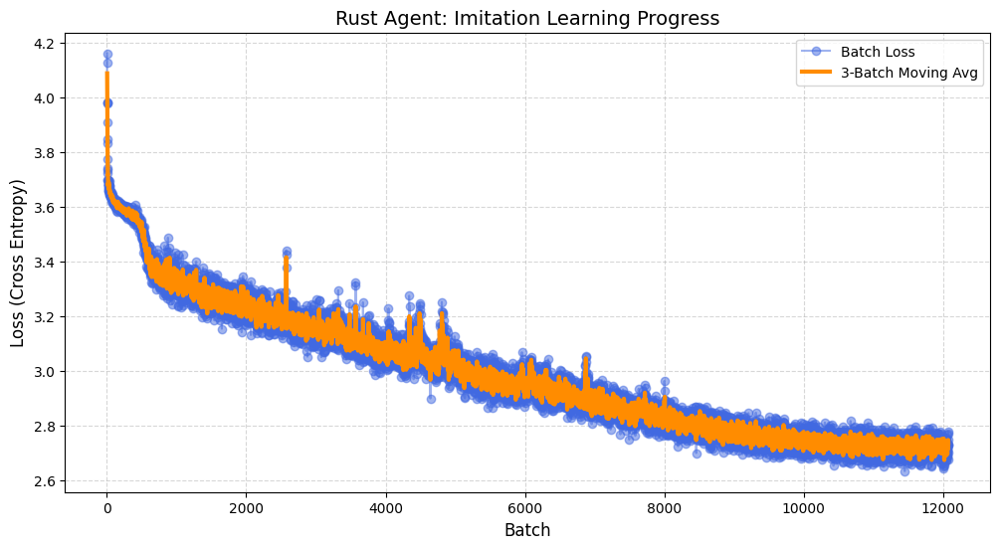

Epoch 99


Epoch 99: 100%|██████████| 122/122 [07:58<00:00,  3.92s/it, loss=2.7]


Epoch 99 | Avg Loss: 2.7205


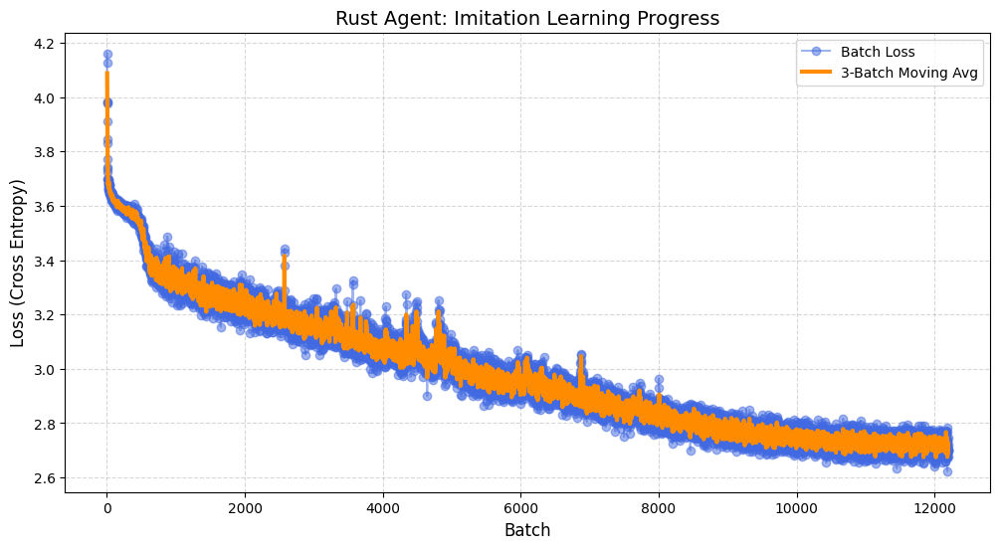

In [ ]:
import math
import torch
import torch.nn as nn
from torch.amp import autocast, GradScaler # Updated import for newer PyTorch versions
from torch.utils.data import DataLoader
import gc
from tqdm import tqdm

def save_checkpoint(model, optimizer, epoch, loss, path):
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss,
    }
    torch.save(checkpoint, path)
    print(f"Checkpoint saved to {path}")

def train_step(model, optimizer, batch, scaler, device, weights_list):
    images, targets = batch

    # images shape: [batch, context_frames, C, H, W]
    # targets shape: [batch, chunk_size, num_action_dims]
    images, targets = images.to(device), targets.to(device).long()

    optimizer.zero_grad()

    with autocast(device_type=device.type):
        # The model now only returns logits and values (no hidden state)
        logits_list, _ = model(images)
        total_loss = 0

        for i in range(len(logits_list)):
            head_logits = logits_list[i]

            # Flattens to [batch * chunk_size]
            head_targets = targets[:, :, i].flatten()

            # Flattens to [batch * chunk_size, num_classes]
            flattened_logits = head_logits.view(-1, head_logits.shape[-1])

            criterion = nn.CrossEntropyLoss(weight=weights_list[i])
            head_loss = criterion(flattened_logits, head_targets)
            total_loss += head_loss

    scaler.scale(total_loss).backward()
    scaler.unscale_(optimizer)
    torch.nn.utils.clip_grad_norm_(model.parameters(), Config.GRADIENT_CLIP)
    scaler.step(optimizer)
    scaler.update()
    scheduler.step()

    return total_loss.item()

# Prepare dataset files outside of the Dataset class
!cp /content/drive/Shareddrives/RustAgent/RustAgent/pretraining/imitation_frames.zip /content/imitation_frames.zip
!unzip -oq /content/imitation_frames.zip -d /content/dataset/

# Dataloader
# IMPORTANT: Ensure your dataset now yields targets of length Config.CHUNK_SIZE
dataset = RustImageDataset("/content/dataset/imitation_frames/", "movement_log.csv", Config.CONTEXT_FRAMES, Config.CHUNK_SIZE)
loader = DataLoader(dataset, batch_size=Config.BATCH_SIZE, shuffle=True, num_workers=4, pin_memory=True, drop_last=True, persistent_workers=True)
print("Dataloader created")

model = Model(chunk_size=Config.CHUNK_SIZE)

# # load model checkpoint
# checkpoint = torch.load("1-13_imitation_models/checkpoint_30.pth")
# model.load_state_dict(checkpoint['model_state_dict'])

model.to(DEVICE)

optimizer = torch.optim.AdamW(model.parameters(), lr=Config.LEARNING_RATE)
# optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
# epoch = checkpoint['epoch']

print("Optimizer loaded")
scheduler = OneCycleLR(
    optimizer,
    max_lr=Config.LEARNING_RATE,
    total_steps=Config.EPOCHS * len(loader),
    pct_start=0.1 # Warmup for the first 10% of training
)
scaler = GradScaler()

history = {
    'epoch_loss': [],
    'batch_loss': []
}

# --- CRITICAL MODEL STATE SETUP ---
# The original `model.train()` caused a TypeError because it recursively called
# the `ultralytics.YOLO.train()` method, which expects a different signature.
# Since `model.yolo` is frozen and should always be in eval mode, we manually
# set the training state of the main model and its other submodules.
model.training = True  # Set the top-level Model instance to training mode

# Iterate through direct children of the Model to set their training state,
# skipping the `model.yolo` submodule to prevent its problematic `train()` call.
for child_module in model.children():
    if child_module is not model.yolo:
        child_module.train() # Recursively sets training mode for other standard nn.Modules

model.yolo.eval() # Explicitly ensures model.yolo remains in evaluation mode
# ----------------------------------

print("Starting Training Loop")
for epoch in range(0, Config.EPOCHS):

    print(f"Epoch {epoch}")
    total_loss = 0
    pbar = tqdm(loader, desc=f"Epoch {epoch}")

    for batch in pbar:
        loss = train_step(model, optimizer, batch, scaler, DEVICE, weights_list)
        total_loss += loss
        pbar.set_postfix({'loss': loss})
        history['batch_loss'].append(loss)

    torch.cuda.empty_cache()
    gc.collect()

    avg_loss = total_loss / len(loader)
    history['epoch_loss'].append(avg_loss)
    print(f"Epoch {epoch} | Avg Loss: {avg_loss:.4f}")

    if epoch % 5 == 0:
        save_checkpoint(model, optimizer, epoch, avg_loss, f"1-13_imitation_models/checkpoint_{epoch}.pth")

    plot_training_progress(history)